<a href="https://colab.research.google.com/github/Abhilash0201/Abhilash-infosys-Nov24/blob/main/FutureCart%3A%20AI-Driven.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#WEEK-1

DATA COLLECTION


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
product1=pd.read_excel(r'/content/drive/MyDrive/infosys/ProductA.xlsx')
product1.head()

,Day Index,Quantity
0,2021-12-01,14
1,2021-12-02,10
2,2021-12-03,13
3,2021-12-04,22
4,2021-12-05,33


FACEBOOK IMPRESSIONS DATA

In [ ]:
facebook_impressions=pd.read_excel(r'/content/drive/MyDrive/infosys/ProductA_fb_impressions.xlsx')
facebook_impressions.head()

,Day Index,Impressions
0,2021-12-01,620
1,2021-12-02,890
2,2021-12-03,851
3,2021-12-04,881
4,2021-12-05,678


GOOGLE CLICKS DATA

In [ ]:
google_clicks=pd.read_excel(r'/content/drive/MyDrive/infosys/ProductA_google_clicks.xlsx')
google_clicks.head()

,Day Index,Clicks
0,2021-12-01,445
1,2021-12-02,433
2,2021-12-03,424
3,2021-12-04,427
4,2021-12-05,451


MERGING DATA

In [ ]:
mergeddata = pd.merge(product1,facebook_impressions , on="Day Index", how="left")
masterdata = pd.merge(mergeddata,google_clicks, on="Day Index", how="left")
masterdata.head()
print(masterdata)

     Day Index  Quantity  Impressions  Clicks
0   2021-12-01        14          620     445
1   2021-12-02        10          890     433
2   2021-12-03        13          851     424
3   2021-12-04        22          881     427
4   2021-12-05        33          678     451
..         ...       ...          ...     ...
207 2022-06-26        13         1218     114
208 2022-06-27        16         1311     106
209 2022-06-28        13          885     109
210 2022-06-29        16         1000      60
211 2022-06-30         8          875      65

[212 rows x 4 columns]


In [ ]:
file_path = '/content/drive/My Drive/infosys/ProductA_masterdata.xlsx'
masterdata.to_excel(file_path, index=False)
print(f"File saved to {file_path}")

File saved to /content/drive/My Drive/infosys/ProductA_masterdata.xlsx



#WEEK 2

EXPLORATORY DATA ANALYSIS AND DATA PREPROCESSING.

DESCRIPTIVE STATISTICS

CHECKS ON TRENDS

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

Summary for Quantity:
count    212.000000
mean      17.542453
std        5.790423
min        5.000000
25%       13.750000
50%       17.000000
75%       21.000000
max       38.000000
Name: Quantity, dtype: float64


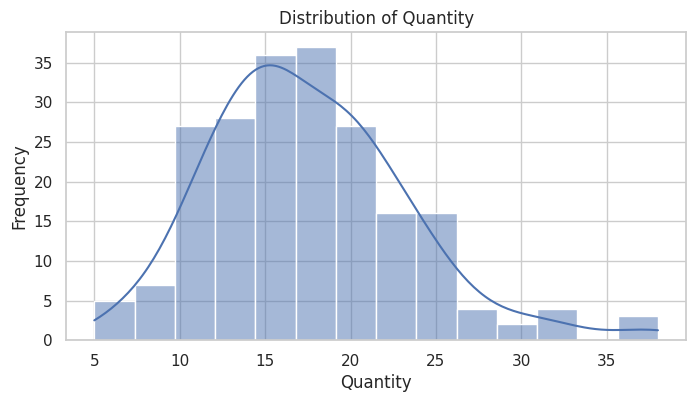


Summary for Impressions:
count     212.000000
mean     1531.702830
std       440.660783
min       620.000000
25%      1209.750000
50%      1460.000000
75%      1862.000000
max      2707.000000
Name: Impressions, dtype: float64


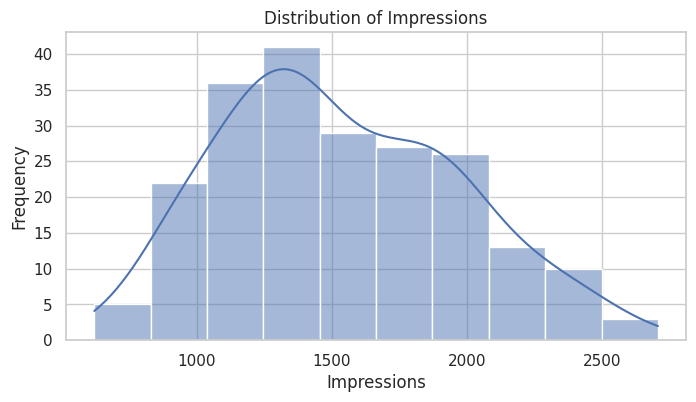


Summary for Clicks:
count    212.00000
mean     358.20283
std      164.52160
min       60.00000
25%      154.00000
50%      402.50000
75%      492.75000
max      726.00000
Name: Clicks, dtype: float64


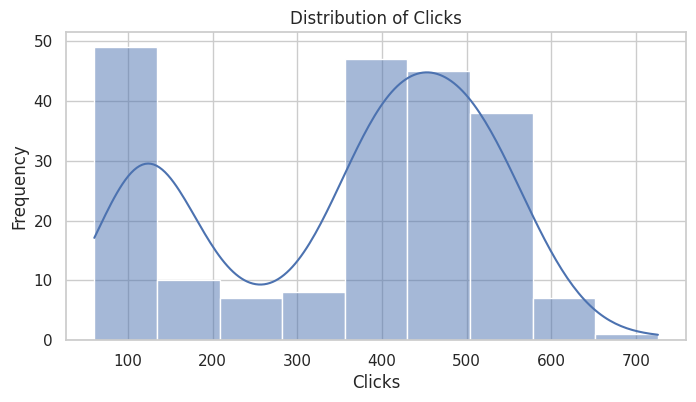

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from google.colab import drive

# Accessing Google Drive if you're using Google Colab
drive.mount('/content/drive')

# Path to the dataset
file_location = '/content/drive/MyDrive/infosys/ProductA_masterdata.xlsx'
data = pd.read_excel(file_location, sheet_name='Sheet1')

# Visualize distribution of selected columns with summary insights
columns_to_plot = ['Quantity', 'Impressions', 'Clicks']
for feature in columns_to_plot:
    # Displaying summary statistics
    print(f"\nSummary for {feature}:")
    print(data[feature].describe())

    # Plotting with Seaborn for visual analysis
    plt.figure(figsize=(8, 4))
    sns.histplot(data[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()


DETECTING MISSING VALUES

In [ ]:
import pandas as pd

# Loading the uploaded Excel file

data = pd.read_excel('/content/drive/MyDrive/infosys/ProductA_masterdata.xlsx')

# Finding missing values
missing_values = data.isnull().sum()

# Display the count of missing values for each column
print(missing_values)

Day Index      0
Quantity       0
Impressions    0
Clicks         0
dtype: int64


BOX PLOTS

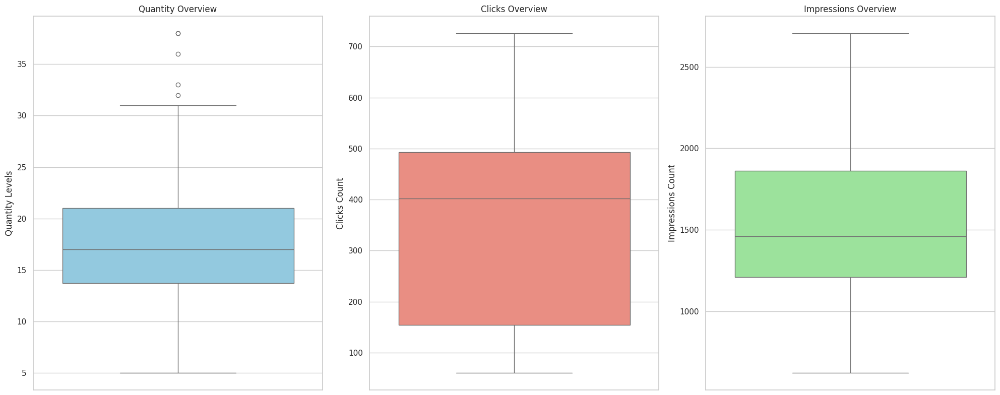

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the path and read the dataset
dataset_path = '/content/drive/MyDrive/infosys/ProductA_masterdata.xlsx'
product_data = pd.read_excel(dataset_path)

# Set up a consistent visual theme for Seaborn plots
sns.set_theme(style="whitegrid")

# Initialize a large figure for subplots
plt.figure(figsize=(20, 8))

# Plot 1: Boxplot for 'Quantity'
plt.subplot(1, 3, 1)
sns.boxplot(y=product_data['Quantity'], color='skyblue')
plt.title('Quantity Overview')
plt.ylabel('Quantity Levels')

# Plot 2: Boxplot for 'Clicks'
plt.subplot(1, 3, 2)
sns.boxplot(y=product_data['Clicks'], color='salmon')
plt.title('Clicks Overview')
plt.ylabel('Clicks Count')

# Plot 3: Boxplot for 'Impressions'
plt.subplot(1, 3, 3)
sns.boxplot(y=product_data['Impressions'], color='lightgreen')
plt.title('Impressions Overview')
plt.ylabel('Impressions Count')

# Layout adjustments for clear presentation
plt.tight_layout()
plt.show()


SALES QUANTITY THROUGH TIME

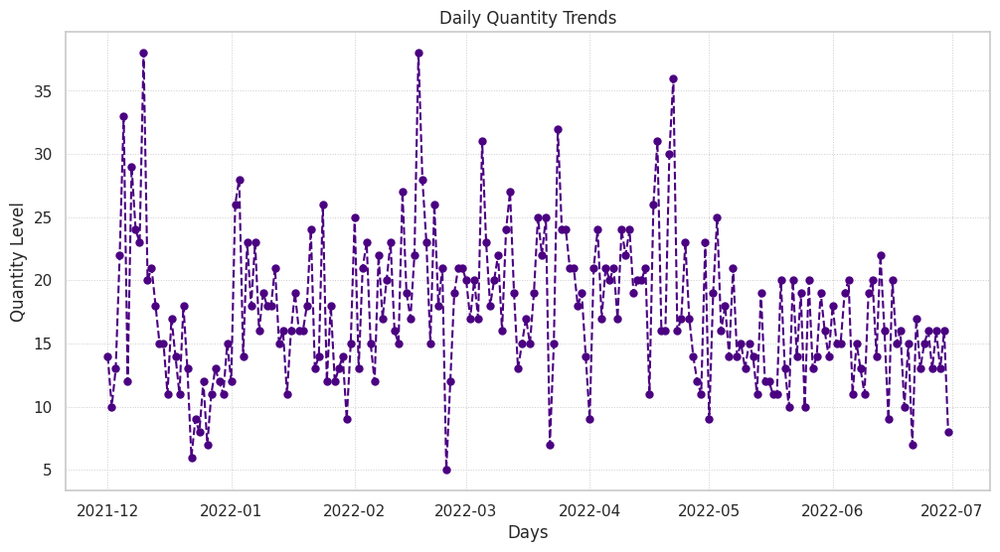

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Path to the dataset
data_path = '/content/drive/MyDrive/infosys/ProductA_mergedata.xlsx'
# data = pd.read_excel(data_path)

# Line plot for 'Quantity' over time (indexed by 'Day Index')
plt.figure(figsize=(12, 6))
plt.plot(data['Day Index'], data['Quantity'], color='indigo', marker='o', linestyle='--', linewidth=1.5, markersize=5)
plt.title('Daily Quantity Trends')
plt.xlabel('Days')
plt.ylabel('Quantity Level')
plt.grid(True, linestyle=':', linewidth=0.7)
plt.show()


FINDING OUTLIERS

In [ ]:
import pandas as pd

# Load data from the Excel file
data = pd.read_excel('/content/drive/MyDrive/infosys/ProductA_masterdata.xlsx')

# Function to detect outliers using the IQR method
def detect_outliers_iqr(data_column):
    q1 = data_column.quantile(0.25)
    q3 = data_column.quantile(0.75)
    iqr_value = q3 - q1

    # Outliers lie outside 1.5*IQR from Q1 and Q3
    outlier_points = data_column[(data_column < (q1 - 1.5 * iqr_value)) | (data_column > (q3 + 1.5 * iqr_value))]
    return outlier_points

# Display the count of outliers in each selected column
print("Outlier Counts for Key Columns:")
print(f"Quantity:      {len(detect_outliers_iqr(data['Quantity']))} outliers")
print(f"Clicks:        {len(detect_outliers_iqr(data['Clicks']))} outliers")
print(f"Impressions:   {len(detect_outliers_iqr(data['Impressions']))} outliers")


Outlier Counts for Key Columns:
Quantity:      5 outliers
Clicks:        0 outliers
Impressions:   0 outliers


In [ ]:
print(f"Quantity:\n{detect_outliers_iqr(data['Quantity'])}")

Quantity:
4      33
9      38
78     38
113    32
142    36
Name: Quantity, dtype: int64


OUTLAIERS IN QUALITY ATTRIBUTES ARE 5

In [ ]:
percentile_95_value = data["Quantity"].quantile(0.87)
print(percentile_95_value)

24.0


REPLACING OUTLAYERS

In [ ]:
import pandas as pd

# Function to cap outliers based on the 87th percentile value for outliers beyond the IQR range
def cap_outliers_iqr(data_series):
    q1, q3 = data_series.quantile([0.25, 0.75])
    iqr_range = q3 - q1
    lower_cutoff = q1 - 1.5 * iqr_range
    upper_cutoff = q3 + 1.5 * iqr_range
    cap_value = data_series.quantile(0.87)

    # Replace outliers with the 87th percentile value
    return data_series.apply(lambda value: cap_value if value < lower_cutoff or value > upper_cutoff else value)

# Apply the outlier capping function to the 'Quantity' column and create a new column
data['Quantity_capped'] = cap_outliers_iqr(data['Quantity'])

print(data.head())

# Save the modified dataset to an Excel file named 'cleaned_data.xlsx'
output_path = '/content/drive/MyDrive/infosys/cleaned_data.xlsx'
data.to_excel(output_path, index=False)

print("The modified dataset has been saved as 'cleaned_data.xlsx'")


   Day Index  Quantity  Impressions  Clicks  Quantity_capped
0 2021-12-01        14          620     445             14.0
1 2021-12-02        10          890     433             10.0
2 2021-12-03        13          851     424             13.0
3 2021-12-04        22          881     427             22.0
4 2021-12-05        33          678     451             24.0
The modified dataset has been saved as 'cleaned_data.xlsx'


AFTER OUTLAIERS TREATMENT

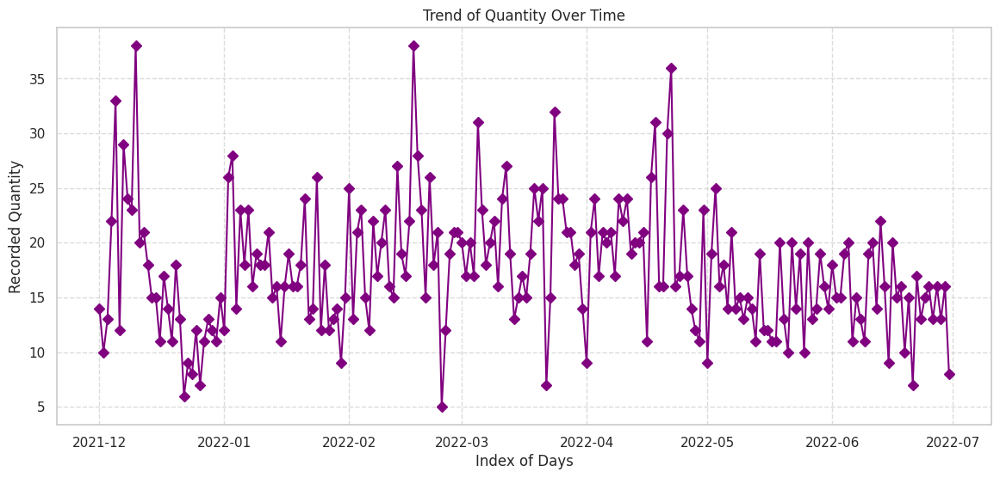

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Define path and load the Excel dataset
dataset_path = '/content/drive/MyDrive/Data/cleaN.xlsx'
# data = pd.read_excel(dataset_path)

# Plotting 'Quantity' across 'Day Index' to show trends over time
plt.figure(figsize=(14, 6))
plt.plot(data['Day Index'], data['Quantity'], color='purple', marker='D', linestyle='-', linewidth=1.5, markersize=6)
plt.title('Trend of Quantity Over Time')
plt.xlabel('Index of Days')
plt.ylabel('Recorded Quantity')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


FEATURE ENGINEERING

In [ ]:
import pandas as pd

# Load the dataset from the specified path
data_path = '/content/drive/MyDrive/infosys/clean.xlsx'
data = pd.read_excel(data_path)

# Convert 'Day Index' to datetime format for easier date operations
data['Day Index'] = pd.to_datetime(data['Day Index'])

# Add a 'Weekend' column where 1 indicates Saturday/Sunday and 0 otherwise
data['Weekend'] = data['Day Index'].dt.weekday.isin([5, 6]).astype(int)

# Extract and add the 'Day of Week' and 'Month' names to the dataset
data['Day of Week'] = data['Day Index'].dt.day_name()
data['Month Name'] = data['Day Index'].dt.month_name()

# Create one-hot encoded columns for the 'Day of Week'
week_days_one_hot = pd.get_dummies(data['Day of Week'], prefix='Day').astype(int)

# Create one-hot encoded columns for the 'Month Name'
months_one_hot = pd.get_dummies(data['Month Name'], prefix='Month').astype(int)

# Concatenate the original data with the new one-hot encoded columns
data = pd.concat([data, week_days_one_hot, months_one_hot], axis=1)

# Save the enhanced dataset to a new Excel file
output_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'
data.to_excel(output_path, index=False)

print("Enhanced dataset saved to 'enhanced_data.xlsx'")


Enhanced dataset saved to 'enhanced_data.xlsx'


ADDING NEW COLUMNS TO DATASET

In [ ]:
import pandas as pd

# Load the enhanced dataset from the specified path
file_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'
df = pd.read_excel(file_path)

# Configure pandas to display all rows and columns for better visualization
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Display the entire dataset to examine its contents
df.head(len(df))


,Day Index,Quantity,Impressions,Clicks,imputed_Quantity,Weekend,Day of Week,Month Name,Day_Friday,Day_Monday,Day_Saturday,Day_Sunday,Day_Thursday,Day_Tuesday,Day_Wednesday,Month_April,Month_December,Month_February,Month_January,Month_June,Month_March,Month_May
0,2021-12-01,14,620,445,14,0,Wednesday,December,0,0,0,0,0,0,1,0,1,0,0,0,0,0
1,2021-12-02,10,890,433,10,0,Thursday,December,0,0,0,0,1,0,0,0,1,0,0,0,0,0
2,2021-12-03,13,851,424,13,0,Friday,December,1,0,0,0,0,0,0,0,1,0,0,0,0,0
3,2021-12-04,22,881,427,22,1,Saturday,December,0,0,1,0,0,0,0,0,1,0,0,0,0,0
4,2021-12-05,33,678,451,24,1,Sunday,December,0,0,0,1,0,0,0,0,1,0,0,0,0,0
5,2021-12-06,12,995,429,12,0,Monday,December,0,1,0,0,0,0,0,0,1,0,0,0,0,0
6,2021-12-07,29,910,444,29,0,Tuesday,December,0,0,0,0,0,1,0,0,1,0,0,0,0,0
7,2021-12-08,24,867,431,24,0,Wednesday,December,0,0,0,0,0,0,1,0,1,0,0,0,0,0
8,2021-12-09,23,1128,456,23,0,Thursday,December,0,0,0,0,1,0,0,0,1,0,0,0,0,0
9,2021-12-10,38,1129,391,24,0,Friday,December,1,0,0,0,0,0,0,0,1,0,0,0,0,0


DATA ANALYSIS


DAY WISE ANALYSIS THROUGH TIME

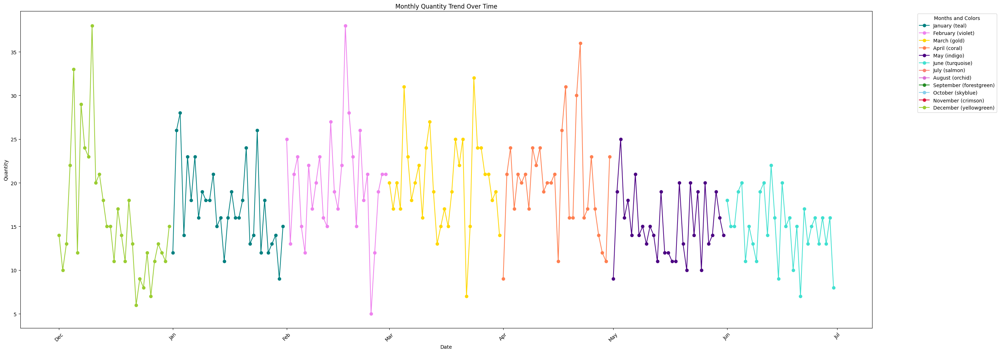

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

# Load the dataset from the specified path
file_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'
data = pd.read_excel(file_path)

# Ensure 'Day Index' is in datetime format for proper plotting
data['Day Index'] = pd.to_datetime(data['Day Index'])

# Create a new column for the month number to facilitate grouping
data['Month Number'] = data['Day Index'].dt.month

# Define new colors for each month
month_colors = [
    "teal", "violet", "gold", "coral", "indigo", "turquoise",
    "salmon", "orchid", "forestgreen", "skyblue", "crimson", "yellowgreen"
]
month_names = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]

# Plotting data for each month with distinct colors and markers
plt.figure(figsize=(28, 10))
for month, color in zip(range(1, 13), month_colors):
    monthly_data = data[data['Month Number'] == month]
    plt.plot(monthly_data['Day Index'], monthly_data['Quantity'], marker='o', linestyle='-',
             color=color, label=f"{month_names[month-1]} ({color})")

# Customize the plot's title, labels, and legend
plt.title("Monthly Quantity Trend Over Time")
plt.xlabel("Date")
plt.ylabel("Quantity")

# Format x-axis dates and rotate them for better visibility
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%b"))
plt.xticks(rotation=45)

# Add legend and adjust layout for clarity
plt.legend(title="Months and Colors", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


DAILY TRENDS FOR CLICKS THROUGH TIME

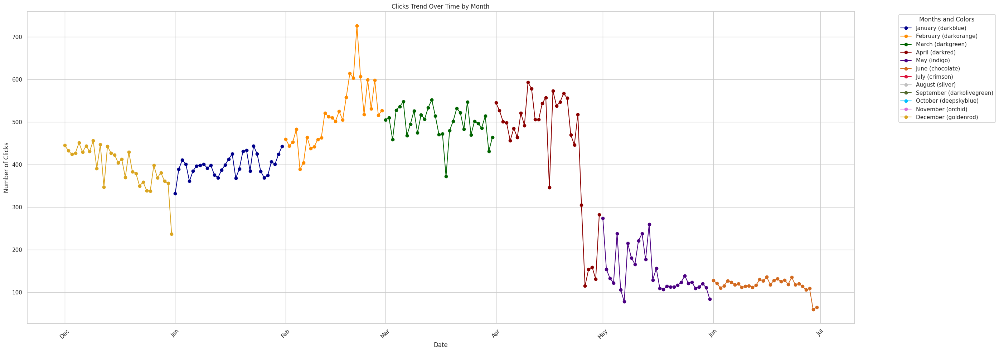

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

# Load the dataset
file_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'
data = pd.read_excel(file_path)

# Ensure 'Day Index' is in datetime format
data['Day Index'] = pd.to_datetime(data['Day Index'])

# Adding a 'Month' column for easy grouping
data['Month Number'] = data['Day Index'].dt.month

# Define a new color palette for each month
new_colors = [
    "darkblue", "darkorange", "darkgreen", "darkred", "indigo", "chocolate",
    "crimson", "silver", "darkolivegreen", "deepskyblue", "orchid", "goldenrod"
]
month_labels = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]

# Plotting the data with different colors for each month
plt.figure(figsize=(28, 10))
for month, color in zip(range(1, 13), new_colors):
    month_data = data[data['Month Number'] == month]
    plt.plot(month_data['Day Index'], month_data['Clicks'], marker='o', linestyle='-',
             color=color, label=f"{month_labels[month-1]} ({color})")

# Customize the plot's title, x-axis, and y-axis labels
plt.title("Clicks Trend Over Time by Month")
plt.xlabel("Date")
plt.ylabel("Number of Clicks")

# Format x-axis to display months
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%b"))
plt.xticks(rotation=45)

# Display the legend and adjust layout for clarity
plt.legend(title="Months and Colors", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Show the plot
plt.show()



DAY WISE TRENDS FOR IMPRESSION THROUGH TIME

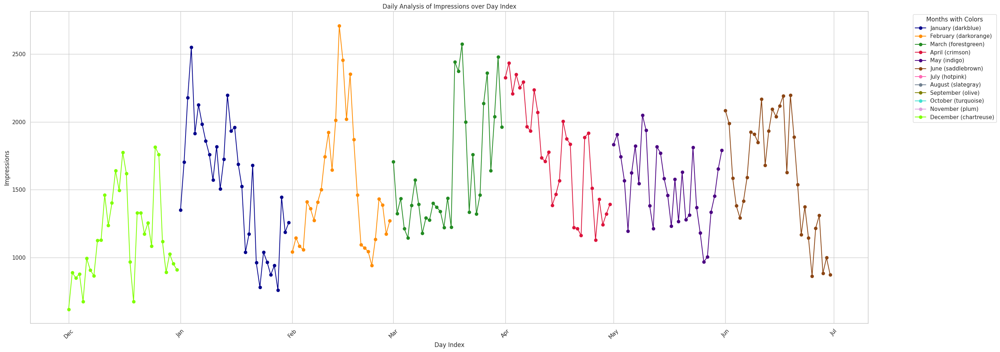

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

# Load the dataset
file_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'
data = pd.read_excel(file_path)

# Ensure 'Day Index' is in datetime format
data['Day Index'] = pd.to_datetime(data['Day Index'])

# Adding a 'Month' column for easy grouping
data['Month'] = data['Day Index'].dt.month

# Define a new color palette for each month
new_colors = [
    "darkblue", "darkorange", "forestgreen", "crimson", "indigo", "saddlebrown",
    "hotpink", "slategray", "olive", "turquoise", "plum", "chartreuse"
]
month_names = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]

# Plot the data with different colors for each month
plt.figure(figsize=(28, 10))
for month, color in zip(range(1, 13), new_colors):
    monthly_data = data[data['Month'] == month]
    plt.plot(monthly_data['Day Index'], monthly_data['Impressions'], marker='o', linestyle='-',
             color=color, label=f"{month_names[month-1]} ({color})")

# Customize the plot's title, x-axis, and y-axis labels
plt.title("Daily Analysis of Impressions over Day Index")
plt.xlabel("Day Index")
plt.ylabel("Impressions")

# Format the x-axis to display months
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%b"))
plt.xticks(rotation=45)

# Display the legend and adjust layout for clarity
plt.legend(title="Months with Colors", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Show the plot
plt.show()


WEEKLY DEMANDS AND TRENDS

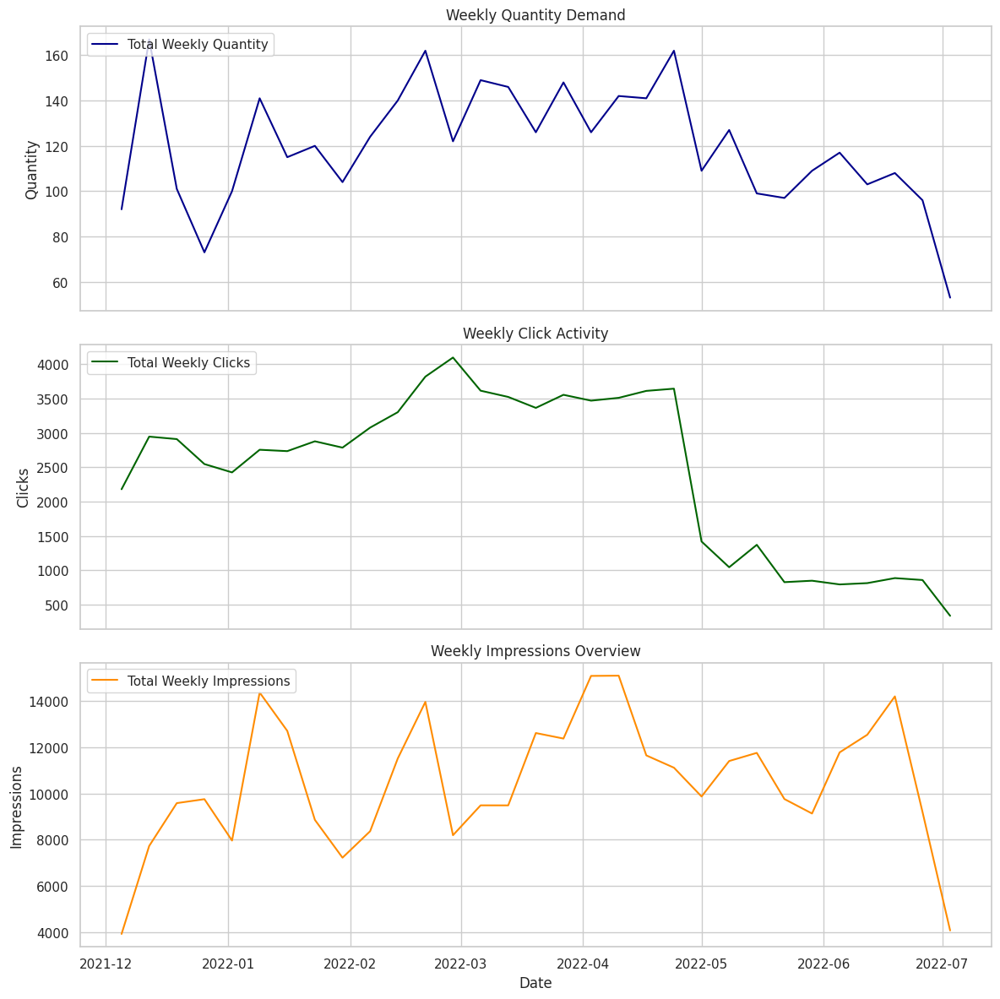

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset from the specified file path
file_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert the 'Day Index' column to datetime format
df['Day Index'] = pd.to_datetime(df['Day Index'])

# Set 'Day Index' as the DataFrame index for easier time-based operations
df.set_index('Day Index', inplace=True)

# Resample the data on a weekly basis and sum up the 'Quantity', 'Clicks', and 'Impressions' columns
weekly_summary = df.resample('W').sum()[['Quantity', 'Clicks', 'Impressions']]

# Create a figure with subplots for each metric
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(12, 12), sharex=True)

# Plotting Total Quantity on a weekly basis
axes[0].plot(weekly_summary.index, weekly_summary['Quantity'], color='darkblue', label='Total Weekly Quantity')
axes[0].set_ylabel('Quantity')
axes[0].set_title('Weekly Quantity Demand')
axes[0].legend(loc='upper left')

# Plotting Total Clicks on a weekly basis
axes[1].plot(weekly_summary.index, weekly_summary['Clicks'], color='darkgreen', label='Total Weekly Clicks')
axes[1].set_ylabel('Clicks')
axes[1].set_title('Weekly Click Activity')
axes[1].legend(loc='upper left')

# Plotting Total Impressions on a weekly basis
axes[2].plot(weekly_summary.index, weekly_summary['Impressions'], color='darkorange', label='Total Weekly Impressions')
axes[2].set_ylabel('Impressions')
axes[2].set_title('Weekly Impressions Overview')
axes[2].legend(loc='upper left')

# Set x-axis label for the last subplot
axes[2].set_xlabel('Date')

# Optimize spacing between subplots
plt.tight_layout()

# Display the plots
plt.show()



MONTHLY DEMANDS AND TRENDS

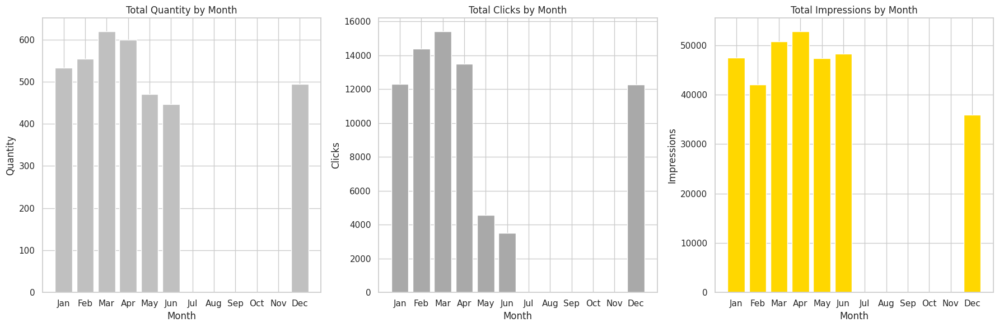

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
df = pd.read_excel('/content/drive/MyDrive/infosys/enhanced_data.xlsx')

# Convert 'Day Index' to datetime format and extract the Month
df['Day Index'] = pd.to_datetime(df['Day Index'])
df['Month'] = df['Day Index'].dt.month

# Calculate total values for 'Quantity', 'Clicks', and 'Impressions' per month
monthly_summary = df.groupby('Month')[['Quantity', 'Clicks', 'Impressions']].sum()

# Set up a figure for subplots with three bar charts for monthly totals
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True)

# Plot the total quantity for each month
axes[0].bar(monthly_summary.index, monthly_summary['Quantity'], color='silver')
axes[0].set_title('Total Quantity by Month')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Quantity')
axes[0].set_xticks(range(1, 13))
axes[0].set_xticklabels(["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])

# Plot the total clicks for each month
axes[1].bar(monthly_summary.index, monthly_summary['Clicks'], color='darkgray')
axes[1].set_title('Total Clicks by Month')
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Clicks')
axes[1].set_xticks(range(1, 13))
axes[1].set_xticklabels(["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])

# Plot the total impressions for each month
axes[2].bar(monthly_summary.index, monthly_summary['Impressions'], color='gold')
axes[2].set_title('Total Impressions by Month')
axes[2].set_xlabel('Month')
axes[2].set_ylabel('Impressions')
axes[2].set_xticks(range(1, 13))
axes[2].set_xticklabels(["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])

# Adjust layout for clarity and display the plot
plt.tight_layout()
plt.show()


MONTHLY TRENDS OF ORIGINAL AND IMPUTED DATA ANALYSIS

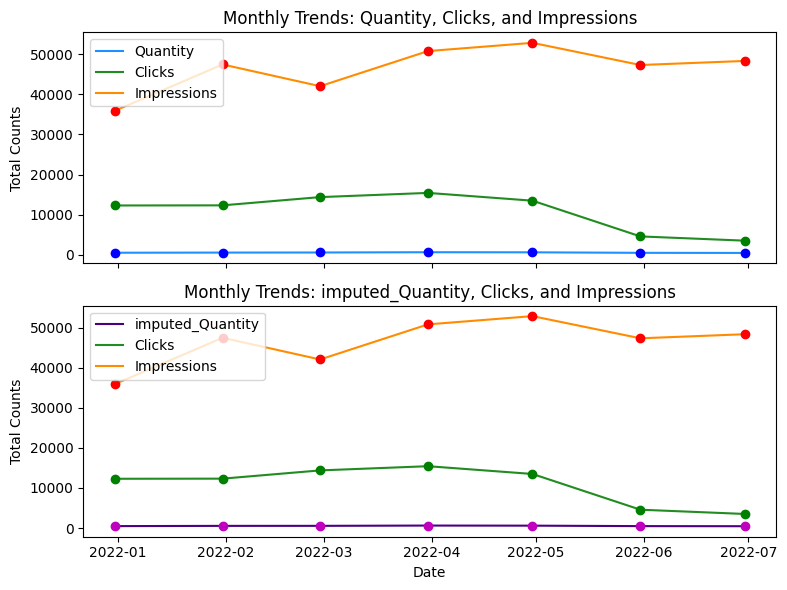

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import warnings

# Suppress future warnings for cleaner output
warnings.simplefilter(action='ignore', category=FutureWarning)

# Load the dataset from the provided file path
file_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Day Index' column to datetime format
df['Day Index'] = pd.to_datetime(df['Day Index'])

# Set 'Day Index' as the index for easy resampling
df.set_index('Day Index', inplace=True)

# Resample the data by month, summing up the relevant columns
monthly_summary = df.resample('M').sum()[['Quantity', 'Clicks', 'Impressions', 'imputed_Quantity']]

# Create subplots for visualizing monthly trends
fig, axes = plt.subplots(2, 1, figsize=(8, 6), sharex=True)

# Plot for the first subplot: Monthly trends for Quantity, Clicks, and Impressions
axes[0].plot(monthly_summary.index, monthly_summary['Quantity'], label='Quantity', color='dodgerblue')
axes[0].plot(monthly_summary.index, monthly_summary['Clicks'], label='Clicks', color='forestgreen')
axes[0].plot(monthly_summary.index, monthly_summary['Impressions'], label='Impressions', color='darkorange')
axes[0].set_ylabel('Total Counts')
axes[0].legend(loc='upper left')
axes[0].set_title('Monthly Trends: Quantity, Clicks, and Impressions')

# Mark peaks for each metric in the first subplot
for date in monthly_summary.index:
    # Get the peak values for Quantity, Clicks, and Impressions
    peak_quantity = monthly_summary.loc[date, 'Quantity']
    peak_clicks = monthly_summary.loc[date, 'Clicks']
    peak_impressions = monthly_summary.loc[date, 'Impressions']

    # Mark the peaks on the plot
    axes[0].plot(date, peak_quantity, 'bo')
    axes[0].plot(date, peak_clicks, 'go')
    axes[0].plot(date, peak_impressions, 'ro')

# Plot for the second subplot: Monthly trends for imputed_Quantity, Clicks, and Impressions
axes[1].plot(monthly_summary.index, monthly_summary['imputed_Quantity'], label='imputed_Quantity', color='indigo')
axes[1].plot(monthly_summary.index, monthly_summary['Clicks'], label='Clicks', color='forestgreen')
axes[1].plot(monthly_summary.index, monthly_summary['Impressions'], label='Impressions', color='darkorange')
axes[1].set_ylabel('Total Counts')
axes[1].legend(loc='upper left')
axes[1].set_title('Monthly Trends: imputed_Quantity, Clicks, and Impressions')

# Mark peaks for each metric in the second subplot
for date in monthly_summary.index:
    # Get the peak values for imputed_Quantity, Clicks, and Impressions
    peak_imputed_quantity = monthly_summary.loc[date, 'imputed_Quantity']
    peak_clicks_2 = monthly_summary.loc[date, 'Clicks']
    peak_impressions_2 = monthly_summary.loc[date, 'Impressions']

    # Mark the peaks on the plot
    axes[1].plot(date, peak_imputed_quantity, 'mo')
    axes[1].plot(date, peak_clicks_2, 'go')
    axes[1].plot(date, peak_impressions_2, 'ro')

# Label the x-axis of the second subplot
axes[1].set_xlabel('Date')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plots
plt.show()


HEATMAP OF CORRELATION MATRIX OF ALL NUMERIC COLUMNS

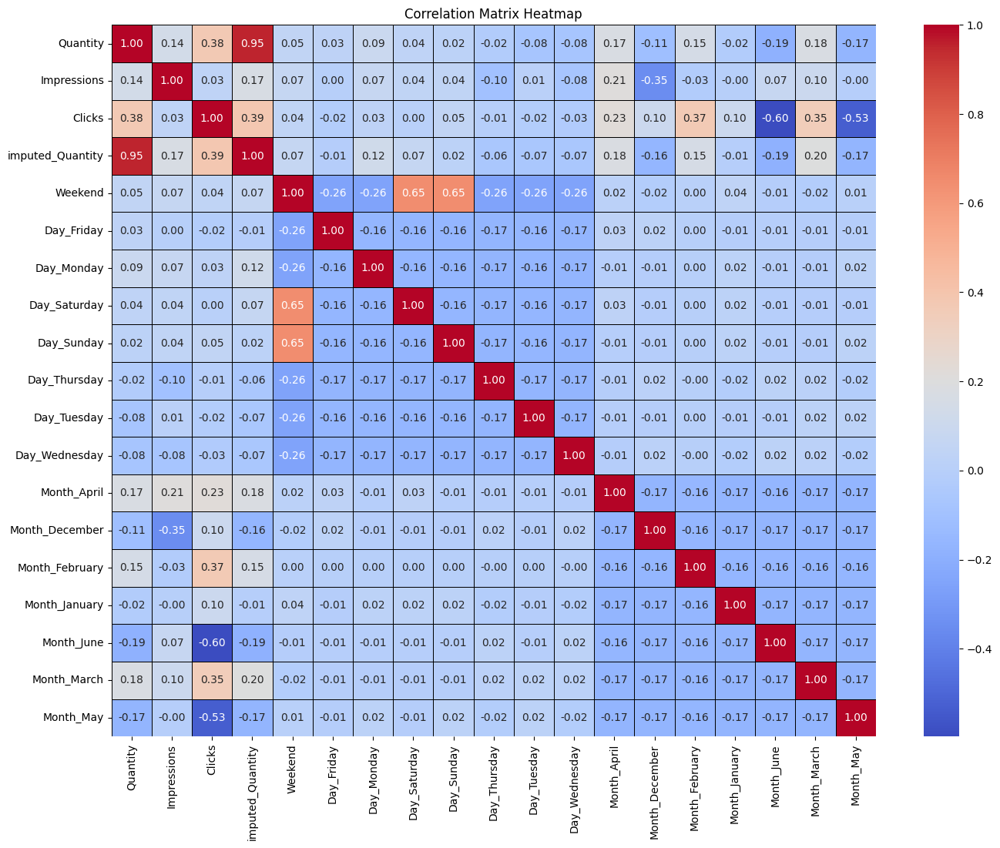

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Load the dataset (ensure this path is correct)
dataset_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'
dataset = pd.read_excel(dataset_path)

# Extract numerical columns from the dataset for correlation analysis
numerical_columns = dataset.select_dtypes(include=['number'])

# Compute the correlation matrix
corr_matrix = numerical_columns.corr()

# Set up the plot size for better visibility
plt.figure(figsize=(16, 12))

# Create a heatmap to visualize correlations with annotations and color customization
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, linecolor='black')
plt.title("Correlation Matrix Heatmap")
plt.show()

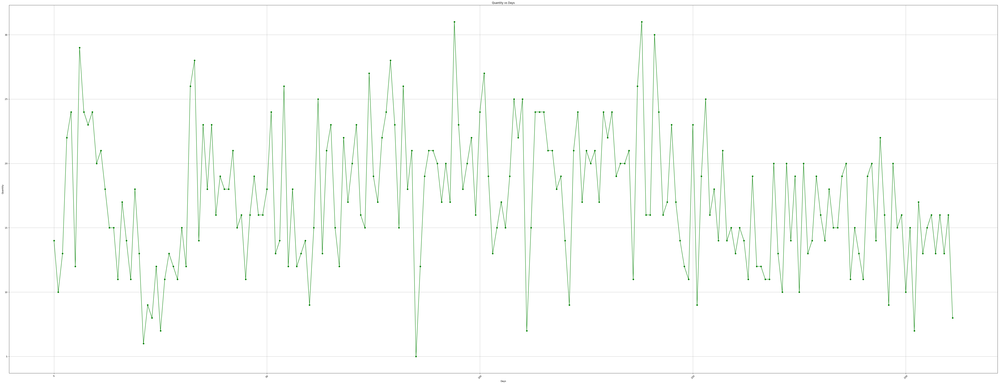

In [ ]:
# TIMESERIES PLOT OF IMPUTED_QUANTITY VS DAY_INDEX USING LINE GRAPH
plt.figure(figsize=(80, 30))
plt.plot(masterdata.index, masterdata['imputed_Quantity'], marker='o', linestyle='-', color='g') # Changed 'Imputed_Quantity' to 'imputed_Quantity'
plt.xlabel('Days')
plt.ylabel('Quantity')
plt.title('Quantity vs Days')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

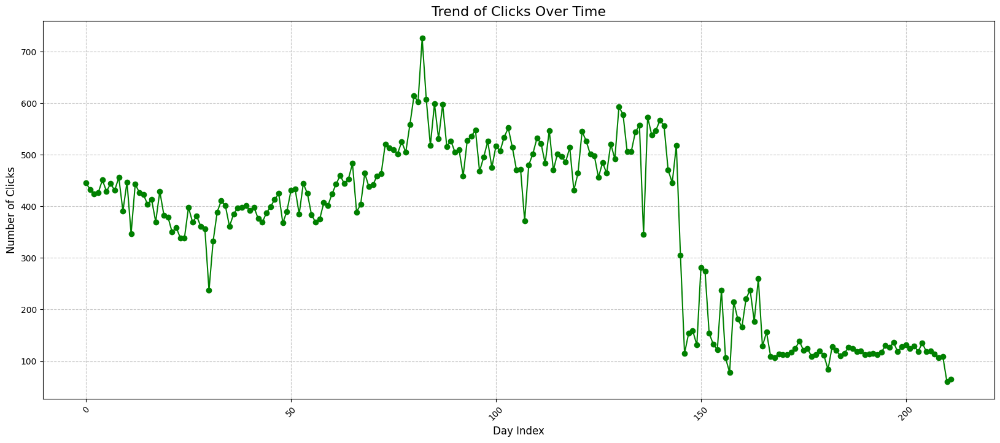

In [ ]:
import matplotlib.pyplot as plt

# Set up the figure size
plt.figure(figsize=(20, 8))  # Adjusted for practical visualization

# Plotting the time series data for Clicks
plt.plot(
    masterdata.index,
    masterdata['Clicks'],
    marker='o',
    linestyle='-',
    color='green',
    label='Clicks'
)

# Add labels and a title
plt.xlabel('Day Index', fontsize=12)
plt.ylabel('Number of Clicks', fontsize=12)
plt.title('Trend of Clicks Over Time', fontsize=16)

# Rotate x-axis tick labels for better readability
plt.xticks(rotation=45)

# Include a grid for clarity
plt.grid(visible=True, linestyle='--', alpha=0.7)

# Display the line graph
plt.show()


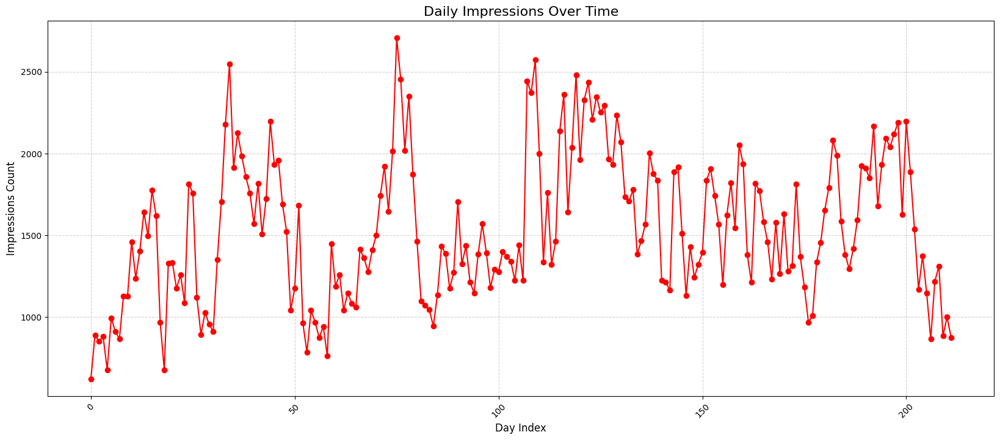

In [ ]:
import matplotlib.pyplot as plt

# Initialize the plot with a specified figure size
plt.figure(figsize=(20, 8))  # Adjusted size for better visualization

# Generate the line graph for Impressions
plt.plot(
    masterdata.index,
    masterdata['Impressions'],
    marker='o',
    linestyle='-',
    color='red',
    label='Impressions'
)

# Add descriptive labels and title
plt.xlabel('Day Index', fontsize=12)
plt.ylabel('Impressions Count', fontsize=12)
plt.title('Daily Impressions Over Time', fontsize=16)

# Rotate x-axis labels for improved readability
plt.xticks(rotation=45)

# Add gridlines for reference
plt.grid(visible=True, linestyle='--', alpha=0.6)

# Display the resulting plot
plt.show()


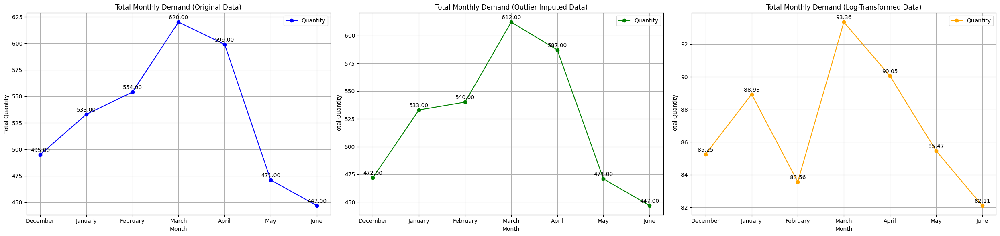

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# ... (other functions: annotate_points, plot_monthly_demand remain the same)

# Main function to create subplots
def create_plots(masterdata):
    # Calculate Log_quantity if it doesn't exist
    if 'Log_quantity' not in masterdata.columns:
        masterdata['Log_quantity'] = np.log1p(masterdata['Quantity'])  # Apply log transformation

    fig, axes = plt.subplots(1, 3, figsize=(25, 6))

    plot_monthly_demand(masterdata, 'Month Name', 'Quantity', 'Total Monthly Demand (Original Data)', axes[0], color='blue')
    plot_monthly_demand(masterdata, 'Month Name', 'imputed_Quantity', 'Total Monthly Demand (Outlier Imputed Data)', axes[1], color='green')
    plot_monthly_demand(masterdata, 'Month Name', 'Log_quantity', 'Total Monthly Demand (Log-Transformed Data)', axes[2], color='orange')

    plt.tight_layout()
    plt.show()

create_plots(masterdata)

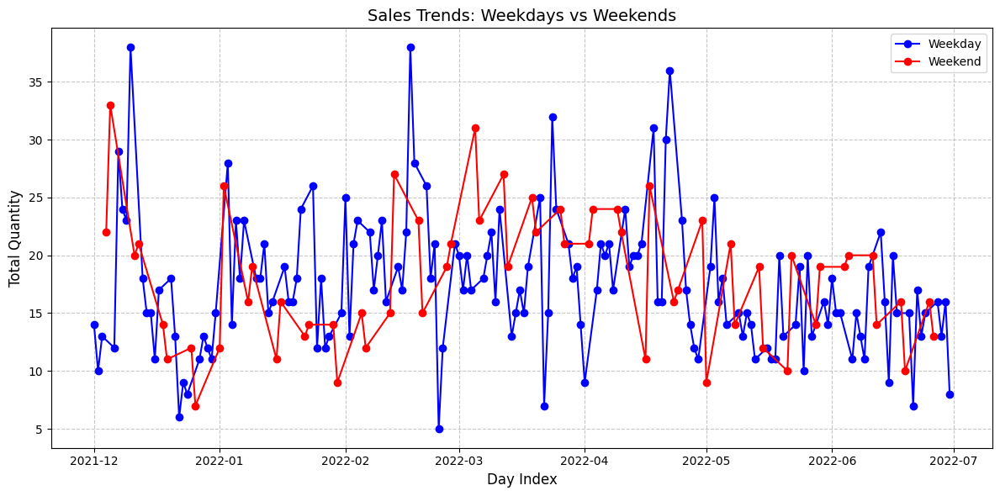

In [ ]:
import matplotlib.pyplot as plt

# Function to plot sales for weekdays and weekends
def plot_weekday_vs_weekend(df, quantity_col, day_col):
    # Define weekday and weekend categories
    weekday_set = {'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'}
    weekend_set = {'Saturday', 'Sunday'}

    # Create a 'Category' column to classify each day
    # Changed 'day_col' from 'Dayofweek' to 'Day of Week' to match the column name in your DataFrame
    df['Category'] = df[day_col].apply(lambda day: 'Weekday' if day in weekday_set else 'Weekend')
    # Aggregate data by 'Day Index' and 'Category'
    aggregated_data = df.groupby(['Day Index', 'Category'])[quantity_col].sum().reset_index()

    # Split the data into weekdays and weekends
    weekday_data = aggregated_data[aggregated_data['Category'] == 'Weekday']
    weekend_data = aggregated_data[aggregated_data['Category'] == 'Weekend']

    # Initialize the plot
    plt.figure(figsize=(12, 6))

    # Plot data for weekdays and weekends
    plt.plot(
        weekday_data['Day Index'], weekday_data[quantity_col],
        marker='o', linestyle='-', color='blue', label='Weekday'
    )
    plt.plot(
        weekend_data['Day Index'], weekend_data[quantity_col],
        marker='o', linestyle='-', color='red', label='Weekend'
    )

    # Add title, labels, and legend
    plt.title('Sales Trends: Weekdays vs Weekends', fontsize=14)
    plt.xlabel('Day Index', fontsize=12)
    plt.ylabel(f'Total {quantity_col}', fontsize=12)
    plt.legend()
    plt.grid(visible=True, linestyle='--', alpha=0.7)
    plt.tight_layout()

    # Display the plot
    plt.show()

# Example usage
# Assuming 'masterdata' contains 'Day of Week', 'Quantity', and 'Day Index'
plot_weekday_vs_weekend(masterdata, 'Quantity', 'Day of Week') # Changed 'Dayofweek' to 'Day of Week'

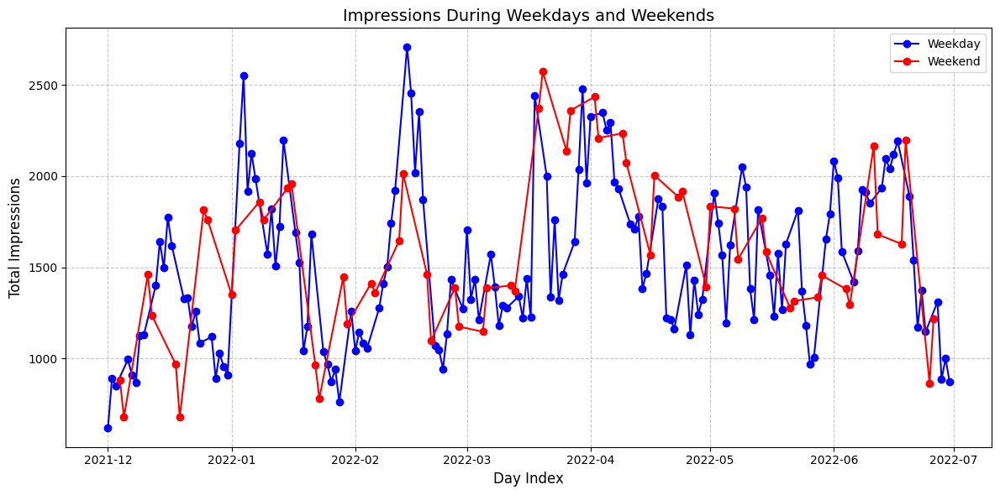

In [ ]:
import matplotlib.pyplot as plt

def plot_weekday_vs_weekend(df, impression_col, day_col):
    """
    Plots impressions data for weekdays and weekends.

    Parameters:
    df (pd.DataFrame): The input dataframe containing the data.
    impression_col (str): The column name for impressions.
    day_col (str): The column name for the day of the week.

    Returns:
    None
    """

    # Define weekday and weekend groups
    weekdays = {'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'}
    weekends = {'Saturday', 'Sunday'}

    # Add a 'Category' column to label each day as Weekday or Weekend
    # Corrected 'Dayofweek' to 'Day of Week' to match the column name in your dataframe
    df['Category'] = df[day_col].apply(lambda x: 'Weekday' if x in weekdays else 'Weekend')

    # Reset index if necessary
    df_reset = df.reset_index() if 'Day Index' not in df.columns else df.copy()

    # Aggregate data by 'Day Index' and 'Category'
    aggregated_data = df_reset.groupby(['Day Index', 'Category'])[impression_col].sum().reset_index()

    # Filter data for weekdays and weekends
    weekday_data = aggregated_data[aggregated_data['Category'] == 'Weekday']
    weekend_data = aggregated_data[aggregated_data['Category'] == 'Weekend']

    # Initialize the plot
    plt.figure(figsize=(12, 6))

    # Plot weekday data
    plt.plot(
        weekday_data['Day Index'], weekday_data[impression_col],
        marker='o', linestyle='-', color='blue', label='Weekday'
    )

    # Plot weekend data
    plt.plot(
        weekend_data['Day Index'], weekend_data[impression_col],
        marker='o', linestyle='-', color='red', label='Weekend'
    )

    # Set title and labels
    plt.title('Impressions During Weekdays and Weekends', fontsize=14)
    plt.xlabel('Day Index', fontsize=12)
    plt.ylabel('Total Impressions', fontsize=12)

    # Add legend and grid
    plt.legend()
    plt.grid(visible=True, linestyle='--', alpha=0.7)

    # Adjust layout for clarity
    plt.tight_layout()

    # Show the plot
    plt.show()

# Example usage:
# Assuming 'masterdata' contains 'Day of Week' and 'Impressions' columns
# Corrected 'Dayofweek' to 'Day of Week'
plot_weekday_vs_weekend(masterdata, 'Impressions', 'Day of Week')

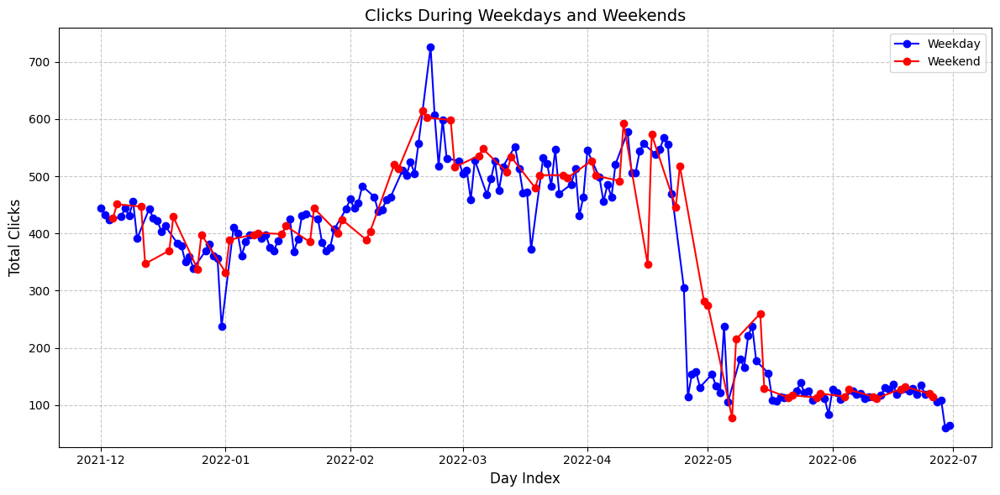

In [ ]:
import matplotlib.pyplot as plt

def plot_weekday_vs_weekend(df, clicks_col, day_col):
    """
    Plots clicks data for weekdays and weekends.

    Parameters:
    df (pd.DataFrame): The input dataframe containing the data.
    clicks_col (str): The column name for clicks.
    day_col (str): The column name for the day of the week.

    Returns:
    None
    """

    # Define weekday and weekend groups
    weekdays = {'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'}
    weekends = {'Saturday', 'Sunday'}

    # Add a 'Category' column to label each day as Weekday or Weekend
    # Corrected 'Dayofweek' to 'Day of Week' to match the column name in your dataframe
    df['Category'] = df[day_col].apply(lambda x: 'Weekday' if x in weekdays else 'Weekend')

    # Reset index if necessary
    df_reset = df.reset_index() if 'Day Index' not in df.columns else df.copy()

    # Aggregate data by 'Day Index' and 'Category'
    aggregated_data = df_reset.groupby(['Day Index', 'Category'])[clicks_col].sum().reset_index()

    # Filter data for weekdays and weekends
    weekday_data = aggregated_data[aggregated_data['Category'] == 'Weekday']
    weekend_data = aggregated_data[aggregated_data['Category'] == 'Weekend']

    # Initialize the plot
    plt.figure(figsize=(12, 6))

    # Plot weekday data
    plt.plot(
        weekday_data['Day Index'], weekday_data[clicks_col],
        marker='o', linestyle='-', color='blue', label='Weekday'
    )

    # Plot weekend data
    plt.plot(
        weekend_data['Day Index'], weekend_data[clicks_col],
        marker='o', linestyle='-', color='red', label='Weekend'
    )

    # Set title and labels
    plt.title('Clicks During Weekdays and Weekends', fontsize=14)
    plt.xlabel('Day Index', fontsize=12)
    plt.ylabel('Total Clicks', fontsize=12)

    # Add legend and grid
    plt.legend()
    plt.grid(visible=True, linestyle='--', alpha=0.7)

    # Adjust layout for clarity
    plt.tight_layout()

    # Show the plot
    plt.show()

# Example usage:
# Assuming 'masterdata' contains 'Day of Week' and 'Clicks' columns
# Corrected 'Dayofweek' to 'Day of Week'
plot_weekday_vs_weekend(masterdata, 'Clicks', 'Day of Week') # Changed 'Dayofweek' to 'Day of Week'

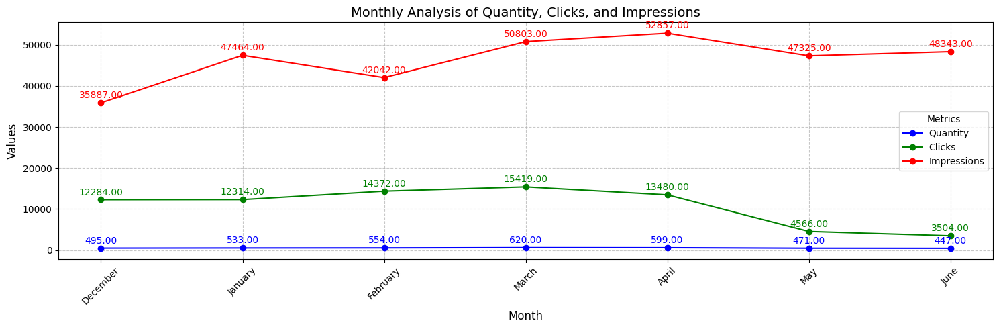

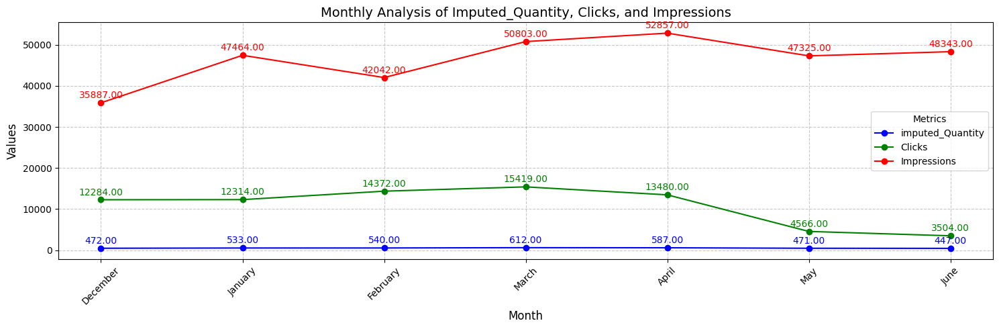

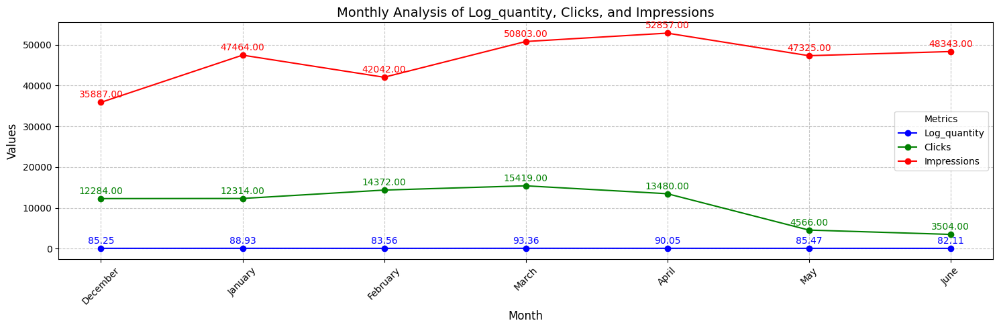

In [ ]:
import matplotlib.pyplot as plt

def plot_aggregated_monthly(df, x_col, y_cols, colors, title):
    """
    Plots aggregated monthly data for multiple columns with annotations.

    Parameters:
    df (pd.DataFrame): The input dataframe containing data.
    x_col (str): The column representing months or x-axis values.
    y_cols (list): A list of column names to be plotted.
    colors (list): A list of colors for each y_col.
    title (str): The title of the plot.

    Returns:
    None
    """
    # Ensure unique months are ordered as they appear in the dataset
    # Changed 'Monthname' to 'Month Name'
    unique_months = df[x_col].unique()

    # Aggregate the data by the x_col and sum the selected y_cols
    df_aggregated = df.groupby(x_col, observed=False)[y_cols].sum().reset_index()
    # Reorder aggregated data to match the order of unique months in the dataset
    df_aggregated = df_aggregated.set_index(x_col).loc[unique_months].reset_index()

    # Initialize the plot
    plt.figure(figsize=(15, 5))

    # Plot each column in y_cols
    for i, y_col in enumerate(y_cols):
        # Plot line with markers
        plt.plot(df_aggregated[x_col], df_aggregated[y_col],
                 marker='o', linestyle='-', color=colors[i], label=y_col)

        # Annotate points above markers
        for j, value in enumerate(df_aggregated[y_col]):
            plt.annotate(f'{value:.2f}',  # Format to two decimal places
                         (df_aggregated[x_col].iloc[j], value),  # Position of annotation
                         textcoords="offset points",  # Offset text position
                         xytext=(0, 5),  # Offset above the marker
                         ha='center',  # Center-align the text
                         color=colors[i])  # Use line color for annotation

    # Set plot title and labels
    plt.title(title, fontsize=14)
    plt.xlabel('Month', fontsize=12)
    plt.ylabel('Values', fontsize=12)

    # Add legend and grid
    plt.legend(title='Metrics')
    plt.xticks(ticks=range(len(df_aggregated[x_col])), labels=df_aggregated[x_col], rotation=45)
    plt.grid(visible=True, linestyle='--', alpha=0.7)

    # Adjust layout for clarity
    plt.tight_layout()

    # Show the plot
    plt.show()


# Example Usage:

# Plot 1: Analysis of 'Quantity', 'Clicks', and 'Impressions'
# Changed 'Monthname' to 'Month Name'
plot_aggregated_monthly(
    masterdata, 'Month Name', ['Quantity', 'Clicks', 'Impressions'],
    ['blue', 'green', 'red'], 'Monthly Analysis of Quantity, Clicks, and Impressions'
)

# Plot 2: Analysis of 'Imputed_Quantity', 'Clicks', and 'Impressions'
# Changed 'Monthname' to 'Month Name', assuming 'Imputed_Quantity' is correct
plot_aggregated_monthly(
    masterdata, 'Month Name', ['imputed_Quantity', 'Clicks', 'Impressions'], # Assuming 'Imputed_Quantity' is 'imputed_Quantity'
    ['blue', 'green', 'red'], 'Monthly Analysis of Imputed_Quantity, Clicks, and Impressions'
)

plot_aggregated_monthly(
    masterdata, 'Month Name', ['Log_quantity', 'Clicks', 'Impressions'],
    ['blue', 'green', 'red'],  # Colors for each line
    'Monthly Analysis of Log_quantity, Clicks, and Impressions' ) # Title for the plot




*   IN THE THREE PLOTS CLICKS AND QUANTITY PEAKS IN MARCH



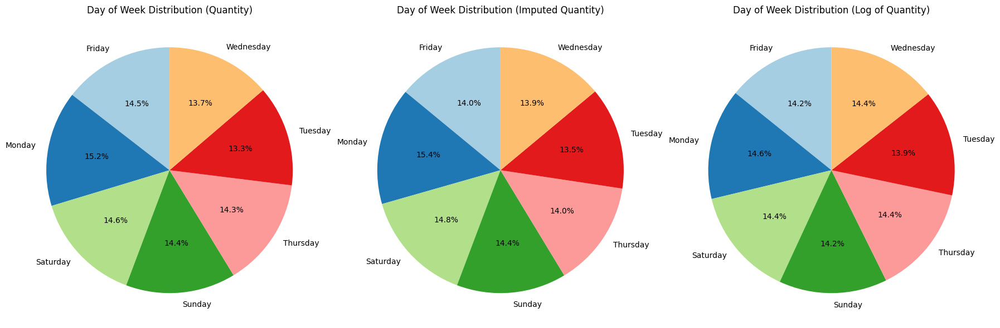

In [ ]:
import matplotlib.pyplot as plt

def plot_dayofweek_pie(df, y_col, title, ax):
    """
    Plots a pie chart for a specified column grouped by 'Day of Week'.

    Parameters:
    df (pd.DataFrame): The input dataframe containing data.
    y_col (str): The column to plot as a pie chart.
    title (str): The title of the pie chart.
    ax (matplotlib.axes.Axes): The subplot axis to draw the pie chart on.

    Returns:
    None
    """
    # Group by 'Day of Week' and sum the values of the specified column
    # Changed 'Dayofweek' to 'Day of Week'
    df_grouped = df.groupby('Day of Week')[y_col].sum()

    # Plot the pie chart
    ax.pie(
        df_grouped,
        labels=df_grouped.index,
        autopct='%1.1f%%',  # Percentage format
        startangle=90,  # Start angle for alignment
        colors=plt.cm.Paired.colors  # Use a colormap
    )

    # Set title and ensure the pie chart is circular
    ax.set_title(title, fontsize=12)
    ax.axis('equal')  # Equal aspect ratio for a circular pie chart


# Example usage:

# Create subplots for three pie charts
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot pie charts for the specified columns
# Changed 'Dayofweek' to 'Day of Week' in the function calls
plot_dayofweek_pie(masterdata, 'Quantity', 'Day of Week Distribution (Quantity)', axes[0])
plot_dayofweek_pie(masterdata, 'imputed_Quantity', 'Day of Week Distribution (Imputed Quantity)', axes[1])  # Assuming 'Imputed_Quantity' is correct
plot_dayofweek_pie(masterdata, 'Log_quantity', 'Day of Week Distribution (Log of Quantity)', axes[2])

# Adjust layout for better spacing and show the plot
plt.tight_layout()
plt.show()

* IN ALL THREE PIE CHARTS SALES QUANTITY IN MAX ON MONDAY.
* IN ALL THREE PIE CHARTS SALES QUANTITY IN LEAST ON TUESDAY

In [ ]:
import os

# Specify the path to save the file
file_path = '/content/drive/My Drive/infosys/Datasets/Feature_engineered_masterdata.xlsx'

# Create the directory if it doesn't exist
os.makedirs(os.path.dirname(file_path), exist_ok=True)

# Save the DataFrame with the original index as a column in the Excel file
masterdata.to_excel(file_path, index=True)  # 'index=True' will save the index (Day Index) as a column
print(f"File saved to {file_path}")

File saved to /content/drive/My Drive/infosys/Datasets/Feature_engineered_masterdata.xlsx


#WEEK 3 & 4

##Time Series Modelling:

Time Series Modeling is a statistical and computational approach to analyzing and forecasting data that is collected and organized sequentially over time. A time series is a set of data points recorded at successive points in time, typically at uniform intervals (e.g., daily, monthly, yearly)

Statistical Methods:

* ARIMA (AutoRegressive Integrated Moving Average): Combines autoregressive and moving average components.
* SARIMA (Seasonal ARIMA): Extends ARIMA to handle seasonality.
* Exponential Smoothing: Averages past observations with exponentially decreasing weights.

In [ ]:
masterdata=pd.read_excel(r'/content/drive/My Drive/infosys/Datasets/Feature_engineered_masterdata.xlsx')


STATIONARITY TEST-ADF
* Staionary series as p-value less than 0.05

In [ ]:
from statsmodels.tsa.stattools import adfuller

def test_stationarity(data_series):
    """
    Performs the Augmented Dickey-Fuller test on a time series to check for stationarity.

    Args:
        data_series (pd.Series): The time series data to test.

    Returns:
        bool: True if the series is stationary (p-value < 0.05), False otherwise.
    """
    # Drop missing values to ensure compatibility with the ADF test
    cleaned_series = data_series.dropna()
    # Run the ADF test
    adf_result = adfuller(cleaned_series)
    # Display the results
    print(f"ADF Statistic: {adf_result[0]:.4f}")
    print(f"p-value: {adf_result[1]:.4f}")
    return adf_result[1] < 0.05  # Stationary if p-value < 0.05

# Example usage
# Changed 'Imputed_Quantity' to 'imputed_Quantity' to match the actual column name
stationary_check = test_stationarity(masterdata['Quantity'])
if stationary_check:
    print("The series is stationary.")
else:
    print("The series is not stationary. Consider transformations like differencing.")

ADF Statistic: -4.4457
p-value: 0.0002
The series is stationary.


In [ ]:
import pandas as pd

# Convert the 'Day Index' column to datetime, handling any errors gracefully
masterdata['Day Index'] = pd.to_datetime(masterdata['Day Index'], errors='coerce')

# Check if any conversions failed
if masterdata['Day Index'].isnull().any():
    print("Warning: Some entries in 'Day Index' could not be converted to datetime and have been set to NaT.")

# Set 'Day Index' as the DataFrame's index for time-based operations
masterdata.set_index('Day Index', inplace=True)

# Confirm the index change
print("Index has been successfully updated to 'Day Index'.")
print(masterdata.index)


Index has been successfully updated to 'Day Index'.
DatetimeIndex(['2021-12-01', '2021-12-02', '2021-12-03', '2021-12-04',
               '2021-12-05', '2021-12-06', '2021-12-07', '2021-12-08',
               '2021-12-09', '2021-12-10',
               ...
               '2022-06-21', '2022-06-22', '2022-06-23', '2022-06-24',
               '2022-06-25', '2022-06-26', '2022-06-27', '2022-06-28',
               '2022-06-29', '2022-06-30'],
              dtype='datetime64[ns]', name='Day Index', length=212, freq=None)


In [ ]:
# Calculate the training dataset size (70% of the total data)
train_size = int(0.7 * len(masterdata))

# Define the target variable for training and testing
train_target = masterdata['Quantity'][:train_size]  # Training target
test_target = masterdata['Quantity'][train_size:]   # Testing target

# List of independent variables (exogenous features)
# Removed features not present in your DataFrame:
exogenous_features = [
    'Impressions', 'Clicks'
]

# Check if all required columns exist in the DataFrame
missing_columns = [col for col in exogenous_features if col not in masterdata.columns]
if missing_columns:
    raise ValueError(f"Missing columns in the DataFrame: {missing_columns}")

# Define the independent variables (exogenous) for training and testing
train_exog = masterdata[exogenous_features][:train_size]
test_exog = masterdata[exogenous_features][train_size:]

# Display shapes for confirmation
print(f"Train Target Shape: {train_target.shape}")
print(f"Test Target Shape: {test_target.shape}")
print(f"Train Exogenous Features Shape: {train_exog.shape}")
print(f"Test Exogenous Features Shape: {test_exog.shape}")

Train Target Shape: (148,)
Test Target Shape: (64,)
Train Exogenous Features Shape: (148, 2)
Test Exogenous Features Shape: (64, 2)


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

def calculate_metrics(true_values, predicted_values):
    """
    Computes evaluation metrics for regression models.

    Args:
        true_values (array-like): Ground truth (actual) values.
        predicted_values (array-like): Predicted values from the model.

    Returns:
        tuple: Contains the following metrics:
            - MAE (Mean Absolute Error)
            - RMSE (Root Mean Squared Error)
            - MSE (Mean Squared Error)
            - MAPE (Mean Absolute Percentage Error)
    """
    # Mean Absolute Error
    mae = mean_absolute_error(true_values, predicted_values)
    # Root Mean Squared Error
    rmse = np.sqrt(mean_squared_error(true_values, predicted_values))
    # Mean Squared Error
    mse = mean_squared_error(true_values, predicted_values)
    # Mean Absolute Percentage Error (Handle potential divide-by-zero warnings)
    mape = np.mean(np.abs((true_values - predicted_values) / np.clip(true_values, a_min=1e-10, a_max=None))) * 100

    return mae, rmse, mse, mape


In [131]:
import matplotlib.pyplot as plt

def plot_residuals(model_fit, model_name):
    """
    Plots residuals of a fitted model to evaluate model performance.

    Args:
        model_fit (statsmodels.regression.results.RegressionResultsWrapper): The fitted model object.
        model_name (str): Name of the model used.

    Returns:
        None
    """
    # Ensure the model fit has residuals
    if not hasattr(model_fit, 'resid'):
        raise ValueError("The model_fit does not contain residuals. Ensure it's a fitted regression model.")

    residuals = model_fit.resid

    # Create the plot
    plt.figure(figsize=(12, 6))
    plt.plot(residuals, label='Residuals', color='purple', linestyle='-', linewidth=2)

    # Plot a horizontal line at 0 for reference
    plt.axhline(0, linestyle='--', color='gray', linewidth=1)

    # Adding labels and title
    plt.xlabel("Index", fontsize=12)
    plt.ylabel("Residuals", fontsize=12)
    plt.title(f'Residual Plot for {model_name}', fontsize=14)

    # Display the legend
    plt.legend(fontsize=12)

    # Add grid for better readability
    plt.grid(True, linestyle='--', alpha=0.5)

    # Tight layout for better presentation
    plt.tight_layout()

    # Show the plot
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_weekly_comparison(true_values, predicted_values, model_name):
    """
    Plots the weekly comparison of true values and predicted values.

    Args:
        true_values (pd.Series): The true values, indexed by date.
        predicted_values (pd.Series or np.array): The predicted values, indexed by date.
        model_name (str): The name of the model used for prediction.

    Returns:
        None
    """
    # Ensure both true and predicted values are pandas Series with datetime index
    if not isinstance(true_values, pd.Series):
        raise ValueError("true_values must be a pandas Series.")

    if not isinstance(predicted_values, (pd.Series, np.ndarray)):
        raise ValueError("predicted_values must be a pandas Series or np.ndarray.")

    # If predicted_values is a numpy array, convert it to a pandas Series with the same index as true_values
    if isinstance(predicted_values, np.ndarray):
        predicted_values = pd.Series(predicted_values, index=true_values.index)

    # Resample both true and predicted values by week and sum them
    true_weekly = true_values.resample('W').sum()
    predicted_weekly = predicted_values.resample('W').sum()

    # Plotting the comparison
    plt.figure(figsize=(12, 6))
    plt.plot(true_weekly.index, true_weekly, label='True Weekly Values', marker='o', color='blue', linestyle='-', linewidth=2)
    plt.plot(predicted_weekly.index, predicted_weekly, label=f'{model_name} Weekly Predictions', marker='o', color='orange', linestyle='--', linewidth=2)

    # Labeling the axes
    plt.xlabel("Week", fontsize=12)
    plt.ylabel("Sum of Imputed Quantity (Weekly)", fontsize=12)
    plt.title(f'{model_name} Model Weekly Predictions', fontsize=14)

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, fontsize=10)

    # Adding a legend and grid for clarity
    plt.legend(fontsize=12)
    plt.grid(visible=True, linestyle='--', alpha=0.6)

    # Display the plot
    plt.tight_layout()  # Adjust layout for better spacing
    plt.show()


AR MODEL :    

An AutoRegressive (AR) model is a type of time series model that predicts future values of a time series based on its past values. It is one of the simplest forms of time series forecasting models and assumes a linear relationship between an observation and a specified number of lagged observations (previous values of the same series)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


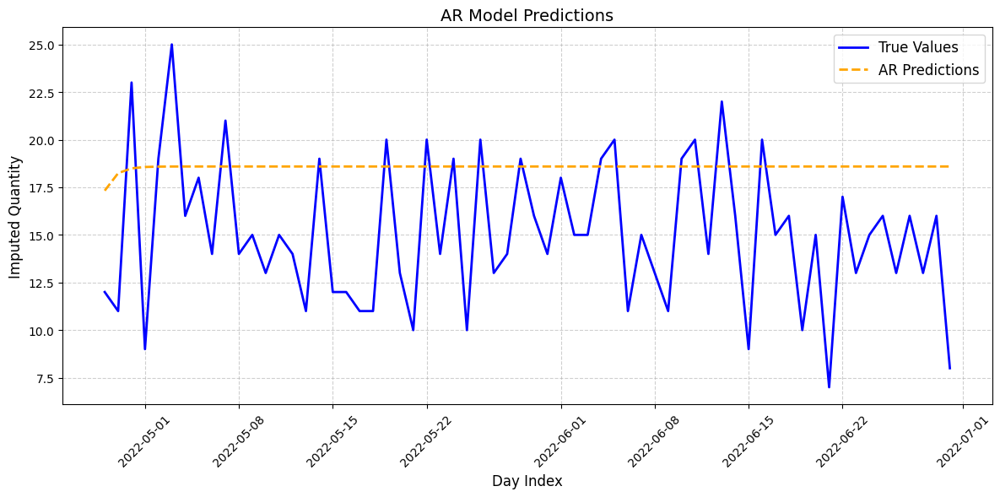

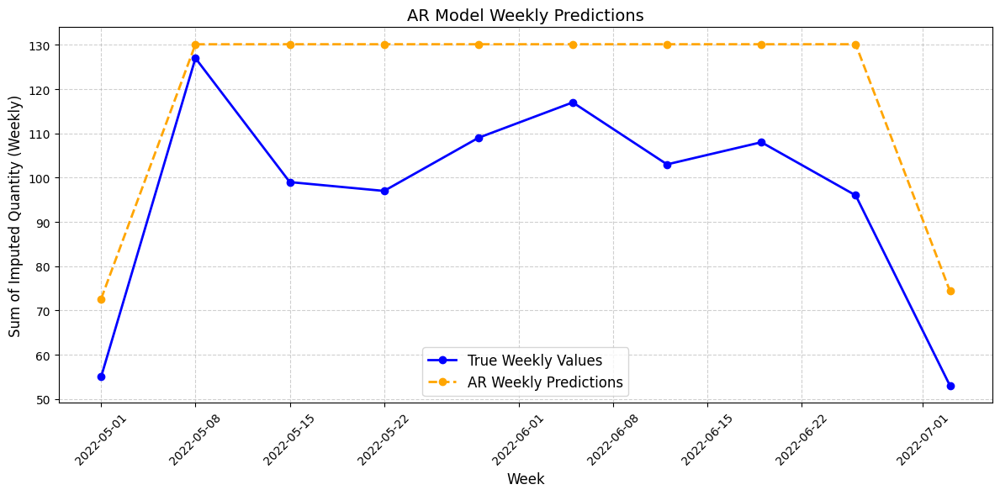

In [ ]:
# Assuming 'masterdata' contains your complete dataset
# Calculate the training dataset size (70% of the total data)
train_size = int(0.7 * len(masterdata))

# Split the data into training and testing sets
train = masterdata['Quantity'][:train_size]  # Training target
test = masterdata['Quantity'][train_size:]   # Testing target

# Now you can proceed with your ARIMA model:
ar_model = ARIMA(train, order=(1, 0, 0))  # AR(1) model
ar_model_fit = ar_model.fit()
ar_predictions = ar_model_fit.forecast(len(test))

# Plot and Evaluate AR Model
plot_model_predictions(test, ar_predictions, "AR")
ar_metrics = calculate_metrics(test, ar_predictions)
# AR Model Weekly Plot
# Remove the datetime_index argument
plot_weekly_comparison(test, ar_predictions, "AR")

MA MODEL:

A Moving Average (MA) model is a time series forecasting technique that models the current value of a series as a linear combination of past forecast errors (or noise). Unlike the AutoRegressive (AR) model, which uses past values of the series itself, the MA model relies on past residuals to make predictions.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


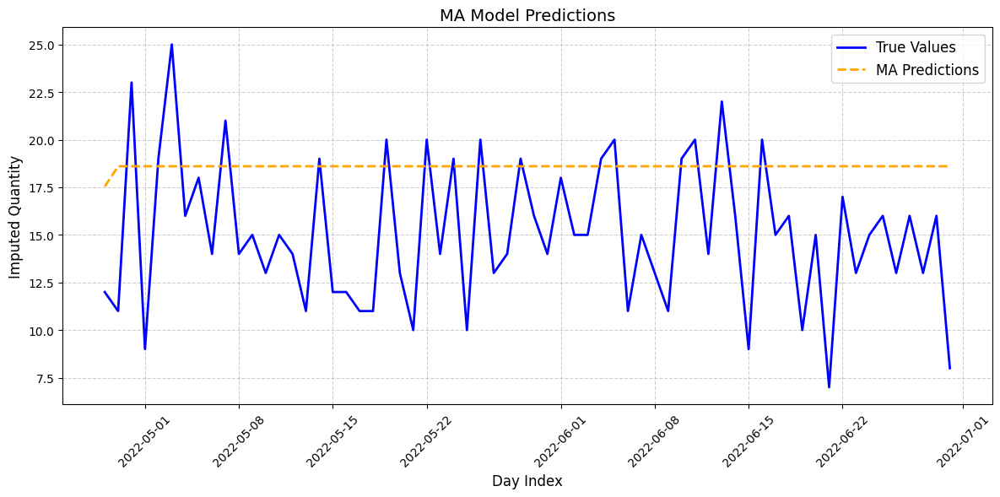

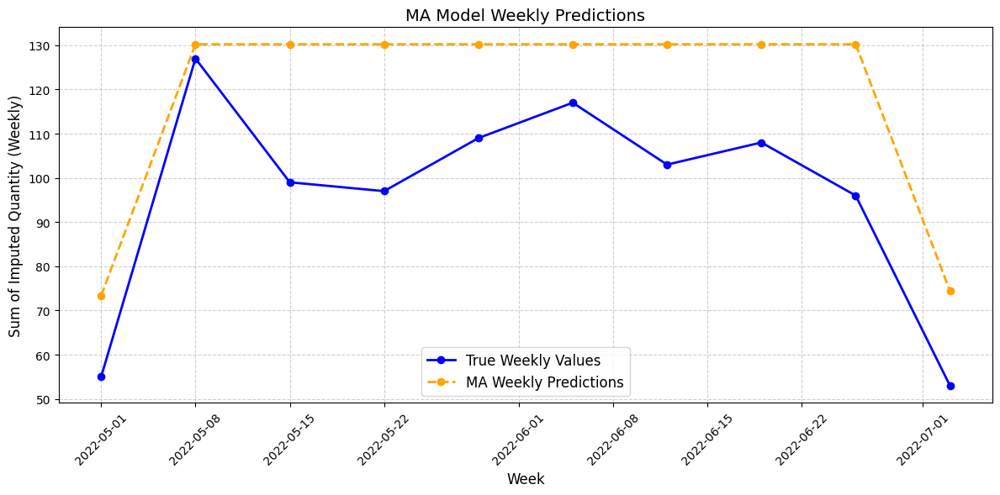

In [ ]:
# Fit the MA model
ma_model = ARIMA(train, order=(0, 0, 1))  # MA(1) model
ma_model_fit = ma_model.fit()
ma_predictions = ma_model_fit.forecast(len(test))

# Plot and Evaluate MA Model
plot_model_predictions(test, ma_predictions, "MA")  # Visualize the model's predictions
ma_metrics = calculate_metrics(test, ma_predictions)  # Evaluate the model's performance

# MA Model Weekly Plot
plot_weekly_comparison(test, ma_predictions, "MA")  # Weekly aggregation comparison


ARIMA MODEL:

The ARIMA (AutoRegressive Integrated Moving Average) model is a powerful and widely used statistical method for time series analysis and forecasting. It combines three key components—AutoRegressive (AR), Integrated (I), and Moving Average (MA)—to handle various types of time series data, including those with trends and non-stationarity

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


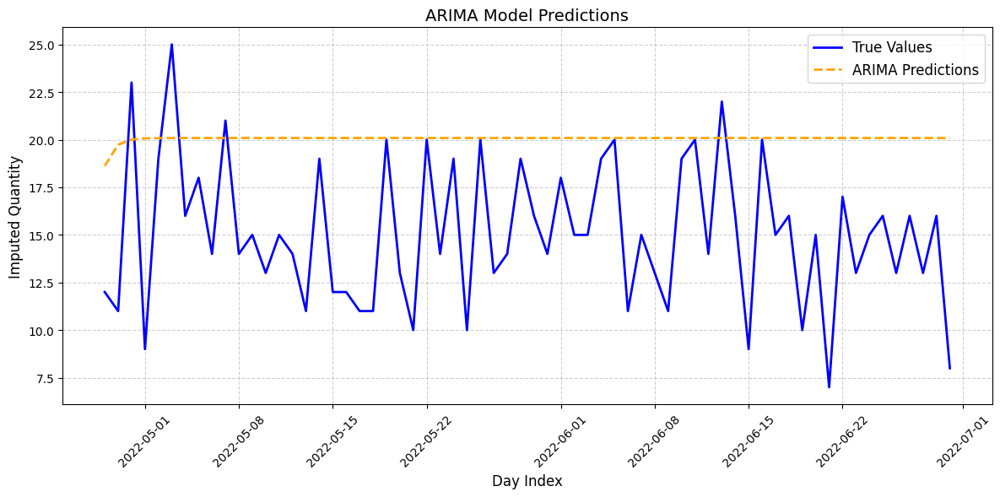

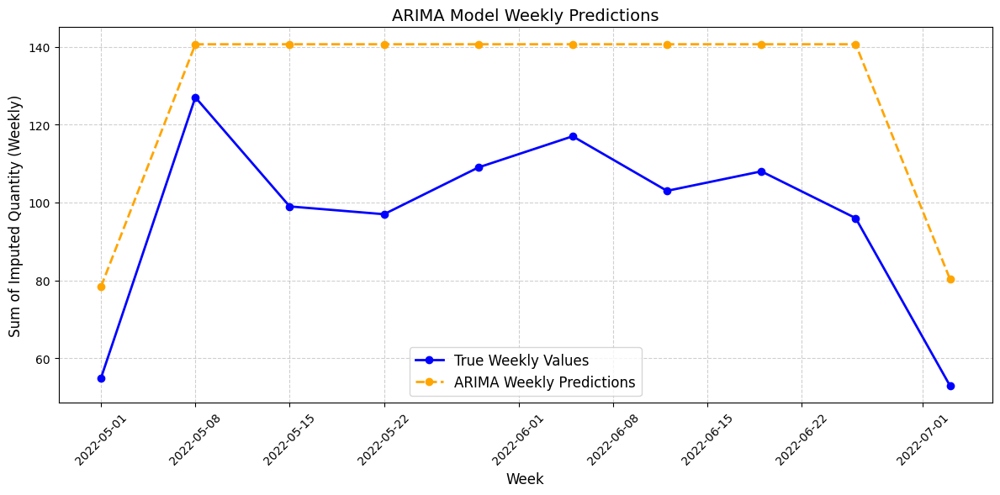

In [ ]:
# Fit the ARIMA model
arima_model = ARIMA(train, order=(1, 1, 1))  # ARIMA(1, 1, 1) model
arima_model_fit = arima_model.fit()
arima_predictions = arima_model_fit.forecast(len(test))

# Plot and Evaluate ARIMA Model
plot_model_predictions(test, arima_predictions, "ARIMA")  # Visualize the predictions
arima_metrics = calculate_metrics(test, arima_predictions)  # Get evaluation metrics

# Weekly Aggregation Plot for ARIMA
plot_weekly_comparison(test, arima_predictions, "ARIMA")  # Compare weekly sums


In [44]:
!pip install optuna
import optuna
from sklearn.metrics import mean_squared_error
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
import pandas as pd # Import pandas for DataFrame operations

# ARIMA Hyperparameter Tuning
def objective_arima(trial, train_data, test_data):
    p = trial.suggest_int("p", 1, 5)
    d = trial.suggest_int("d", 0, 2)
    q = trial.suggest_int("q", 1, 5)

    model = ARIMA(train_data, order=(p, d, q))
    model_fit = model.fit()
    predictions = model_fit.forecast(len(test_data))

    # Return RMSE as the objective metric
    return np.sqrt(mean_squared_error(test_data, predictions))

# Load your masterdata here
masterdata = pd.read_excel(r'/content/drive/My Drive/infosys/Datasets/Feature_engineered_masterdata.xlsx') # Assuming this is the correct path

# Assuming train_target and test_target are defined as in your previous cell:
# Calculate the training dataset size (70% of the total data)
train_size = int(0.7 * len(masterdata))

# Define the target variable for training and testing
train_target = masterdata['Quantity'][:train_size]  # Training target
test_target = masterdata['Quantity'][train_size:]   # Testing target

# Create Optuna study for ARIMA
study_arima = optuna.create_study(direction='minimize')

# Pass train_target and test_target to objective_arima:
study_arima.optimize(lambda trial: objective_arima(trial, train_target, test_target), n_trials=50)

best_arima_params = study_arima.best_params

# Print best ARIMA parameters
print("Best ARIMA Parameters:", best_arima_params)

[I 2024-12-19 15:20:05,598] A new study created in memory with name: no-name-43655f6c-2ad3-4bdb-90ee-1fa8ec10d85f
[I 2024-12-19 15:20:10,962] Trial 0 finished with value: 4.868258488147437 and parameters: {'p': 5, 'd': 2, 'q': 1}. Best is trial 0 with value: 4.868258488147437.
[I 2024-12-19 15:20:15,392] Trial 1 finished with value: 5.155730723200214 and parameters: {'p': 4, 'd': 1, 'q': 4}. Best is trial 0 with value: 4.868258488147437.
[I 2024-12-19 15:20:26,579] Trial 2 finished with value: 5.3532314174028865 and parameters: {'p': 5, 'd': 0, 'q': 4}. Best is trial 0 with value: 4.868258488147437.
[I 2024-12-19 15:20:30,628] Trial 3 finished with value: 5.126980785102537 and parameters: {'p': 3, 'd': 0, 'q': 5}. Best is trial 0 with value: 4.868258488147437.
[I 2024-12-19 15:20:32,870] Trial 4 finished with value: 5.142462434329528 and parameters: {'p': 5, 'd': 0, 'q': 1}. Best is trial 0 with value: 4.868258488147437.
[I 2024-12-19 15:20:34,314] Trial 5 finished with value: 5.151709

Best ARIMA Parameters: {'p': 4, 'd': 2, 'q': 3}


[I 2024-12-19 15:26:38,356] A new study created in memory with name: no-name-7f173c32-8b20-45d8-bf93-e8488225d3a0
[I 2024-12-19 15:26:38,967] Trial 0 finished with value: 8.165499949290782 and parameters: {'p': 1, 'd': 2, 'q': 4}. Best is trial 0 with value: 8.165499949290782.
[I 2024-12-19 15:26:39,750] Trial 1 finished with value: 5.405309473344903 and parameters: {'p': 5, 'd': 0, 'q': 2}. Best is trial 1 with value: 5.405309473344903.
[I 2024-12-19 15:26:39,930] Trial 2 finished with value: 5.957665088016408 and parameters: {'p': 3, 'd': 1, 'q': 1}. Best is trial 1 with value: 5.405309473344903.
[I 2024-12-19 15:26:40,431] Trial 3 finished with value: 8.271193783624282 and parameters: {'p': 2, 'd': 2, 'q': 3}. Best is trial 1 with value: 5.405309473344903.
[I 2024-12-19 15:26:41,212] Trial 4 finished with value: 8.165499949290782 and parameters: {'p': 1, 'd': 2, 'q': 4}. Best is trial 1 with value: 5.405309473344903.
[I 2024-12-19 15:26:46,554] Trial 5 finished with value: 4.4920930

Best ARIMA Parameters: {'p': 4, 'd': 2, 'q': 3}
ARIMA Model hyperparameter tuning results saved to '/content/drive/My Drive/infosys/Datasets/ARIMA_hyperparameter_tuning_results.xlsx'


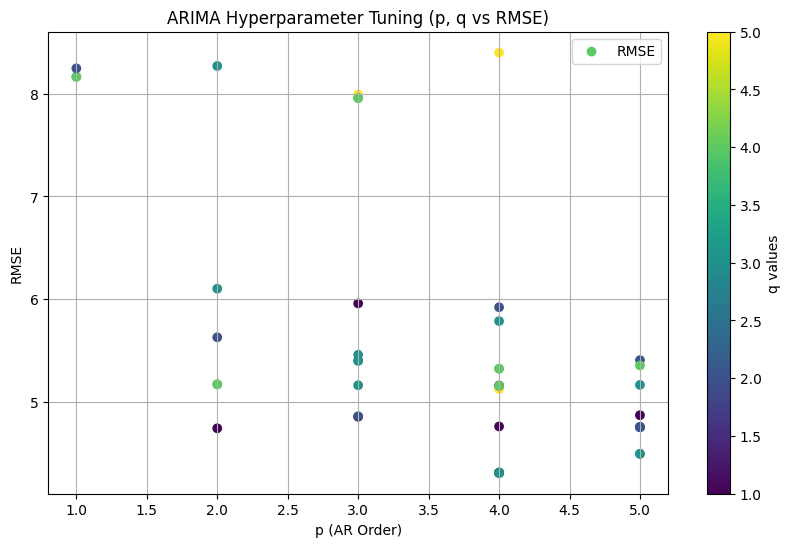

In [48]:
!pip install optuna
import optuna
from sklearn.metrics import mean_squared_error
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
import pandas as pd # Import pandas for DataFrame operations
import matplotlib.pyplot as plt # Import for plotting

# ARIMA Hyperparameter Tuning
def objective_arima(trial, train_data, test_data):
    p = trial.suggest_int("p", 1, 5)
    d = trial.suggest_int("d", 0, 2)
    q = trial.suggest_int("q", 1, 5)

    model = ARIMA(train_data, order=(p, d, q))
    model_fit = model.fit()
    predictions = model_fit.forecast(len(test_data))

    # Return RMSE as the objective metric
    return np.sqrt(mean_squared_error(test_data, predictions))

# Load your masterdata here
masterdata = pd.read_excel(r'/content/drive/My Drive/infosys/Datasets/Feature_engineered_masterdata.xlsx') # Assuming this is the correct path

# Assuming train_target and test_target are defined as in your previous cell:
# Calculate the training dataset size (70% of the total data)
train_size = int(0.7 * len(masterdata))

# Define the target variable for training and testing
train_target = masterdata['Quantity'][:train_size]  # Training target
test_target = masterdata['Quantity'][train_size:]   # Testing target

# Create Optuna study for ARIMA
study_arima = optuna.create_study(direction='minimize')

# Pass train_target and test_target to objective_arima:
study_arima.optimize(lambda trial: objective_arima(trial, train_target, test_target), n_trials=50)

best_arima_params = study_arima.best_params

# Print best ARIMA parameters
print("Best ARIMA Parameters:", best_arima_params)

# Create a list to store the results of each trial
arima_results = []

# Iterate through all trials and store results
for trial in study_arima.trials:
    arima_results.append([trial.params['p'], trial.params['d'], trial.params['q'], trial.value])

# Create a DataFrame from the results list
arima_results_df = pd.DataFrame(arima_results, columns=['p', 'd', 'q', 'RMSE'])

# Save results to an Excel file
arima_results_df.to_excel(r'/content/drive/My Drive/infosys/Datasets/ARIMA_hyperparameter_tuning_results.xlsx', index=False)
print("ARIMA Model hyperparameter tuning results saved to '/content/drive/My Drive/infosys/Datasets/ARIMA_hyperparameter_tuning_results.xlsx'")

# Visualize RMSE for different (p, d, q) combinations
plt.figure(figsize=(10, 6))
plt.scatter(arima_results_df['p'], arima_results_df['RMSE'], c=arima_results_df['q'], cmap='viridis', label='RMSE')
plt.colorbar(label='q values')
plt.title("ARIMA Hyperparameter Tuning (p, q vs RMSE)")
plt.xlabel("p (AR Order)")
plt.ylabel("RMSE")
plt.legend()
plt.grid()
plt.show()

ARIMA Tuned Metrics: {'MSE': 18.558112237158227, 'RMSE': 4.307912747161695, 'MAE': 3.662037802320987, 'MAPE': 29.10570243819921}


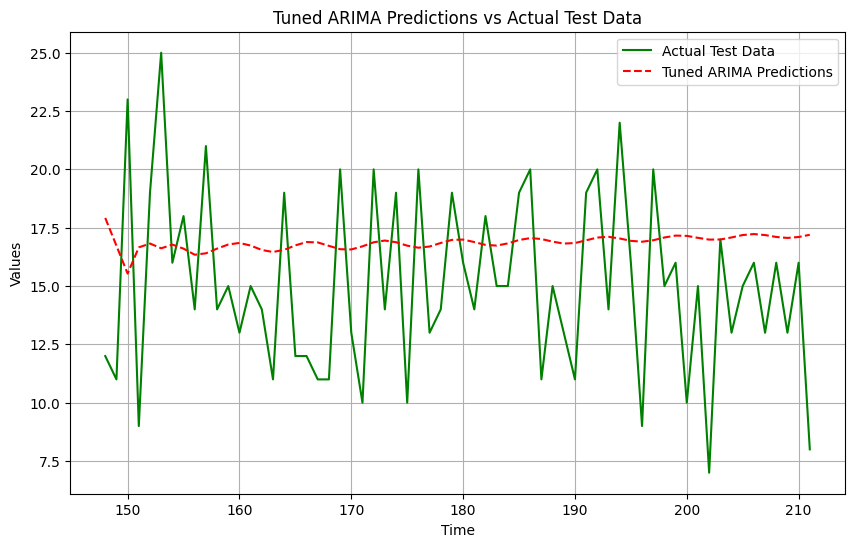

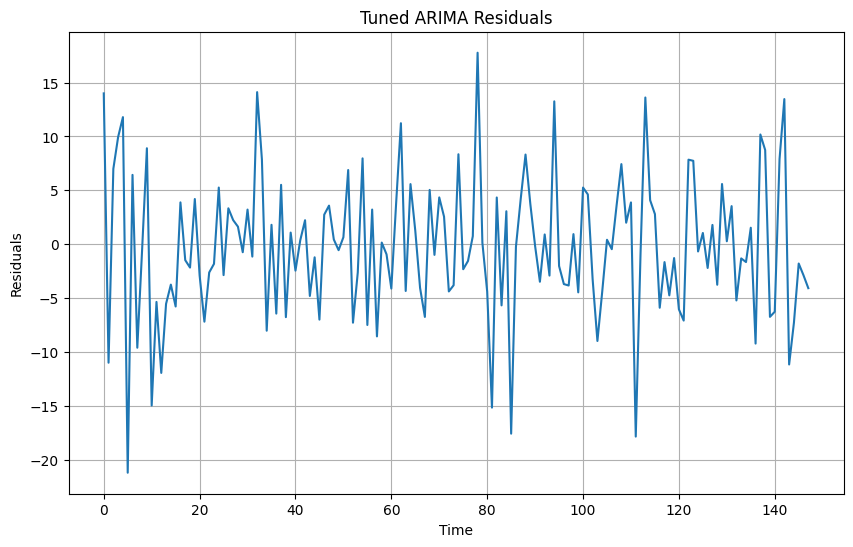

In [77]:
# Fit ARIMA with best parameters
arima_tuned_model = ARIMA(train,
                          order=(best_arima_params['p'], best_arima_params['d'], best_arima_params['q']))
arima_tuned_model_fit = arima_tuned_model.fit()

# Predict with ARIMA tuned
arima_tuned_predictions = arima_tuned_model_fit.forecast(len(test))

# Evaluate ARIMA tuned
arima_tuned_metrics = calculate_metrics(test, arima_tuned_predictions)
print("ARIMA Tuned Metrics:", arima_tuned_metrics)

# Plot ARIMA tuned predictions
plot_model_predictions(test, arima_tuned_predictions, "Tuned ARIMA")
plot_residuals(arima_tuned_model_fit, "Tuned ARIMA")
# plot_weekly_comparison(test,arima_tuned_predictions, "TUNED ARIMA")



SARIMA MODEL:

A SARIMA (Seasonal ARIMA) model is an extension of the ARIMA model that explicitly supports seasonal components in time series data. It combines both ARIMA and seasonal differencing, and it is useful when you have seasonality in your data

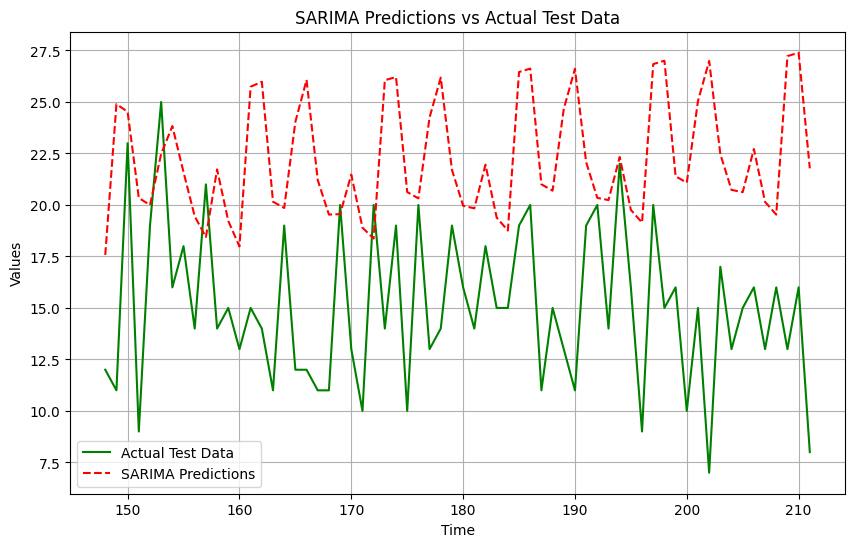

In [86]:
sarima_model = SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_model_fit = sarima_model.fit()
sarima_predictions = sarima_model_fit.forecast(len(test))

# Plot and Evaluate SARIMA Model
plot_model_predictions(test, sarima_predictions, "SARIMA")
sarima_metrics = calculate_metrics(test, sarima_predictions)
# plot_weekly_comparison(test,sarima_predictions, "SARIMA")

In [16]:
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
import optuna

# Assuming `train` and `test` are defined time series datasets
# Replace with your actual data preparation
# Example:
# train = your_train_series
# test = your_test_series

def objective_sarima(trial):
    # Hyperparameter suggestions
    p = trial.suggest_int("p", 1, 5)
    d = trial.suggest_int("d", 0, 2)
    q = trial.suggest_int("q", 1, 5)
    P = trial.suggest_int("P", 0, 2)
    D = trial.suggest_int("D", 0, 1)
    Q = trial.suggest_int("Q", 0, 2)
    s = 12  # Fixed seasonal period (e.g., monthly data)

    try:
        # Fit SARIMA with trial parameters
        model = SARIMAX(train,
                        order=(p, d, q),
                        seasonal_order=(P, D, Q, s))
        model_fit = model.fit(disp=False)
        predictions = model_fit.forecast(steps=len(test))

        # Return RMSE as the objective metric
        return np.sqrt(mean_squared_error(test, predictions))
    except Exception as e:
        # Return a large error for invalid models
        return float("inf")

# Create and optimize the study
study_sarima = optuna.create_study(direction='minimize')
study_sarima.optimize(objective_sarima, n_trials=50)

# Output the best parameters
best_sarima_params = study_sarima.best_params
print("Best SARIMA Parameters:", best_sarima_params)


[I 2024-12-19 14:35:28,046] A new study created in memory with name: no-name-214fb5c5-1c76-47e8-b3fe-94cfbb7645f2
[I 2024-12-19 14:35:28,059] Trial 0 finished with value: inf and parameters: {'p': 1, 'd': 0, 'q': 5, 'P': 2, 'D': 0, 'Q': 2}. Best is trial 0 with value: inf.
[I 2024-12-19 14:35:28,066] Trial 1 finished with value: inf and parameters: {'p': 2, 'd': 2, 'q': 4, 'P': 1, 'D': 1, 'Q': 2}. Best is trial 0 with value: inf.
[I 2024-12-19 14:35:28,074] Trial 2 finished with value: inf and parameters: {'p': 3, 'd': 0, 'q': 2, 'P': 2, 'D': 0, 'Q': 2}. Best is trial 0 with value: inf.
[I 2024-12-19 14:35:28,082] Trial 3 finished with value: inf and parameters: {'p': 3, 'd': 0, 'q': 2, 'P': 0, 'D': 1, 'Q': 2}. Best is trial 0 with value: inf.
[I 2024-12-19 14:35:28,089] Trial 4 finished with value: inf and parameters: {'p': 5, 'd': 0, 'q': 5, 'P': 0, 'D': 0, 'Q': 0}. Best is trial 0 with value: inf.
[I 2024-12-19 14:35:28,098] Trial 5 finished with value: inf and parameters: {'p': 2, 

Best SARIMA Parameters: {'p': 1, 'd': 0, 'q': 5, 'P': 2, 'D': 0, 'Q': 2}


SARIMA Model hyperparameter tuning results saved to '/content/drive/My Drive/infosys/Datasets/Feature_engineered_masterdata.xlsx') .


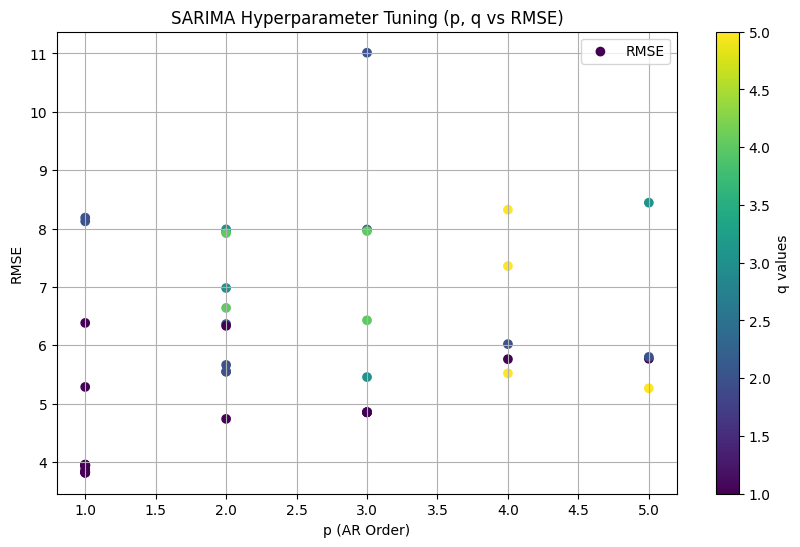

In [89]:
# Save results to an Excel file
sarima_results_df.to_excel('/content/drive/My Drive/infosys/Datasets/Feature_engineered_masterdata.xlsx' , index=False)
print("SARIMA Model hyperparameter tuning results saved to '/content/drive/My Drive/infosys/Datasets/Feature_engineered_masterdata.xlsx') .")

# Visualize RMSE for different (p, d, q) combinations
plt.figure(figsize=(10, 6))
plt.scatter(sarima_results_df['p'], sarima_results_df['RMSE'], c=sarima_results_df['q'], cmap='viridis', label='RMSE')
plt.colorbar(label='q values')
plt.title("SARIMA Hyperparameter Tuning (p, q vs RMSE)")
plt.xlabel("p (AR Order)")
plt.ylabel("RMSE")
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimized SARIMA Model Metrics: (3.662037802320987, 4.307912747161695, 18.558112237158227, 29.10570243819921)


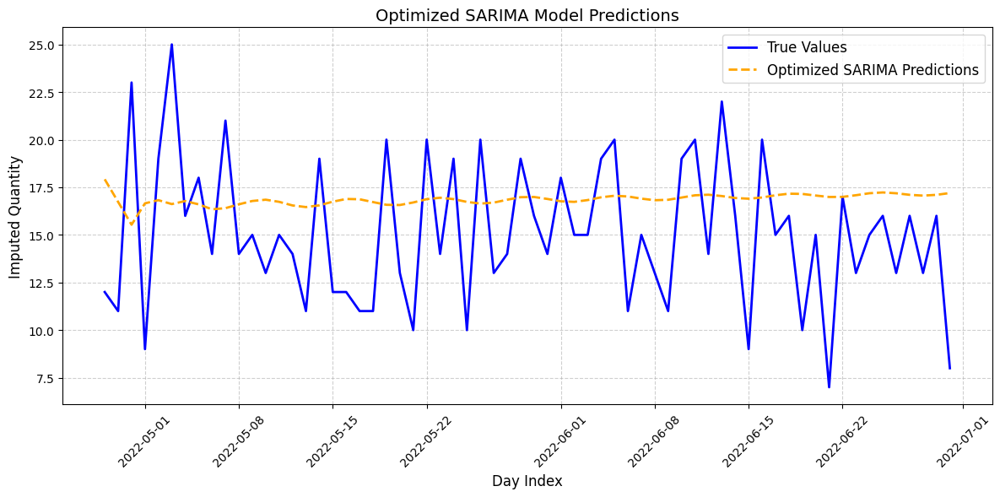

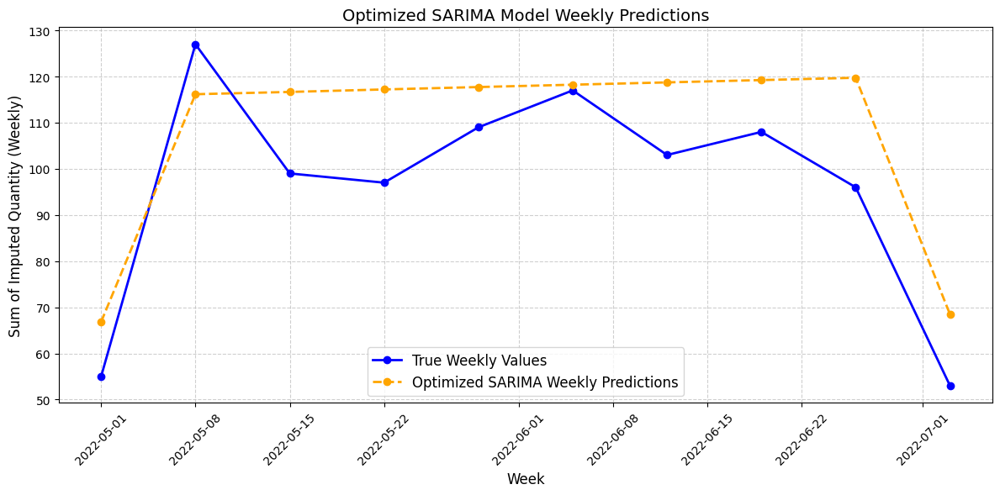

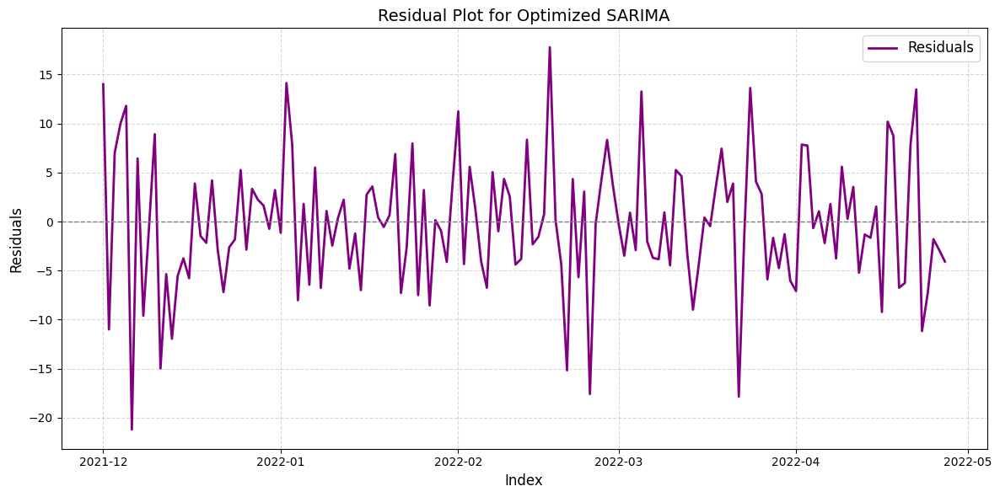

In [ ]:
# Fit SARIMA model using the optimized parameters
sarima_optimized_model = SARIMAX(train,
                                 order=(best_sarima_params['p'], best_sarima_params['d'], best_sarima_params['q']),
                                 seasonal_order=(best_sarima_params['P'], best_sarima_params['D'], best_sarima_params['Q'], 12))
sarima_optimized_model_fit = sarima_optimized_model.fit()

# Generate predictions using the tuned SARIMA model
sarima_optimized_predictions = sarima_optimized_model_fit.forecast(len(test))

# Calculate and display performance metrics for the tuned SARIMA model
sarima_optimized_metrics = calculate_metrics(test, sarima_optimized_predictions)
print("Optimized SARIMA Model Metrics:", sarima_optimized_metrics)

# Visualize the predictions made by the tuned SARIMA model
plot_model_predictions(test, sarima_optimized_predictions, "Optimized SARIMA")
plot_weekly_comparison(test, sarima_optimized_predictions, "Optimized SARIMA")
plot_residuals(sarima_optimized_model_fit, "Optimized SARIMA")



ARIMAX MODEL:

An ARIMAX (AutoRegressive Integrated Moving Average with eXogenous variables) model is an extension of the ARIMA model that incorporates exogenous variables (additional predictors) to help explain the behavior of the dependent variable. This model is useful when you have time series data that is influenced by other external variables (predictors), such as weather data, economic indicators, or other external factors.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


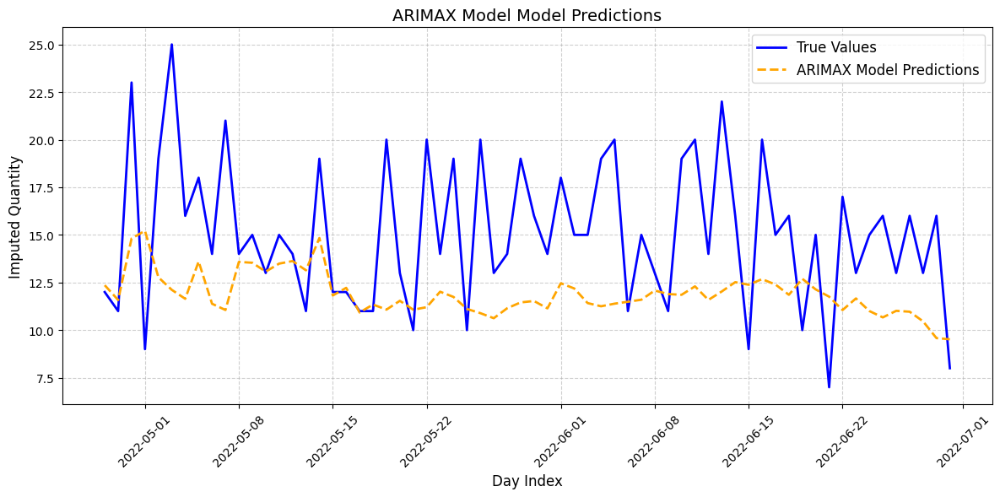

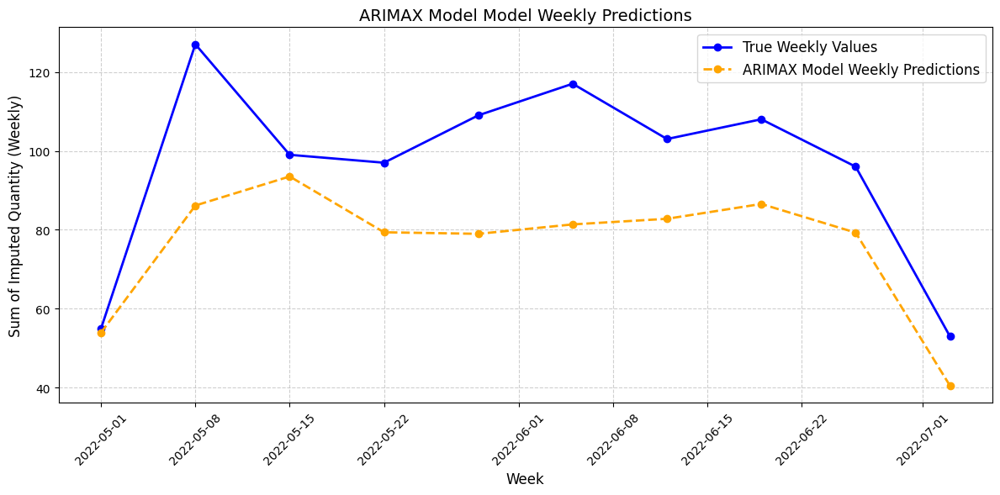

In [ ]:
# Define and fit the ARIMAX model (ARIMA with exogenous variables)
arimax_model_with_exog = ARIMA(train, order=(1, 1, 1), exog=train_exog)  # ARIMAX model utilizes external factors
arimax_model_fitted = arimax_model_with_exog.fit()

# Make predictions using the ARIMAX model on the test set with external data
arimax_forecast = arimax_model_fitted.forecast(len(test), exog=test_exog)

# Visualize the model's predictions
plot_model_predictions(test, arimax_forecast, "ARIMAX Model")

# Compute and print performance metrics for the ARIMAX model
arimax_model_metrics = calculate_metrics(test, arimax_forecast)

# Weekly comparison plot for ARIMAX model predictions
plot_weekly_comparison(test, arimax_forecast, "ARIMAX Model")


In [ ]:
# Function to optimize ARIMAX hyperparameters using Optuna
def arimax_objective(trial):
    # Suggest values for ARIMA parameters p, d, q
    p_value = trial.suggest_int("p", 1, 5)
    d_value = trial.suggest_int("d", 0, 2)
    q_value = trial.suggest_int("q", 1, 5)

    # Build and fit ARIMAX model with the suggested parameters
    arimax_model = ARIMA(train, order=(p_value, d_value, q_value), exog=train_exog)
    arimax_model_fitted = arimax_model.fit()

    # Forecast using the fitted ARIMAX model
    forecasted_values = arimax_model_fitted.forecast(len(test), exog=test_exog)

    # Calculate RMSE as the evaluation metric
    return np.sqrt(mean_squared_error(test, forecasted_values))

# Initialize an Optuna study to minimize the RMSE for ARIMAX
arimax_study = optuna.create_study(direction='minimize')
arimax_study.optimize(arimax_objective, n_trials=50)

# Retrieve the best ARIMAX hyperparameters from the study
optimal_arimax_params = arimax_study.best_params

# Output the optimal ARIMAX parameters
print("Optimal ARIMAX Hyperparameters:", optimal_arimax_params)

[I 2024-12-18 14:26:03,124] A new study created in memory with name: no-name-78b829b4-2985-49b4-bf8d-7347c06c9e6d
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-p

Optimal ARIMAX Hyperparameters: {'p': 1, 'd': 2, 'q': 2}


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  

Evaluation Metrics for Tuned ARIMAX: (3.071844476867793, 3.93389387882544, 15.475521049860266, 22.162717317032335)


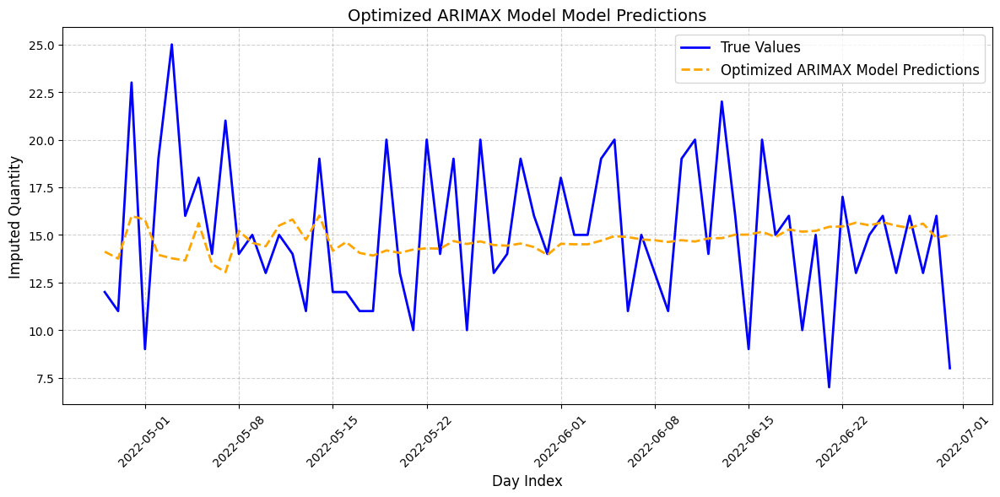

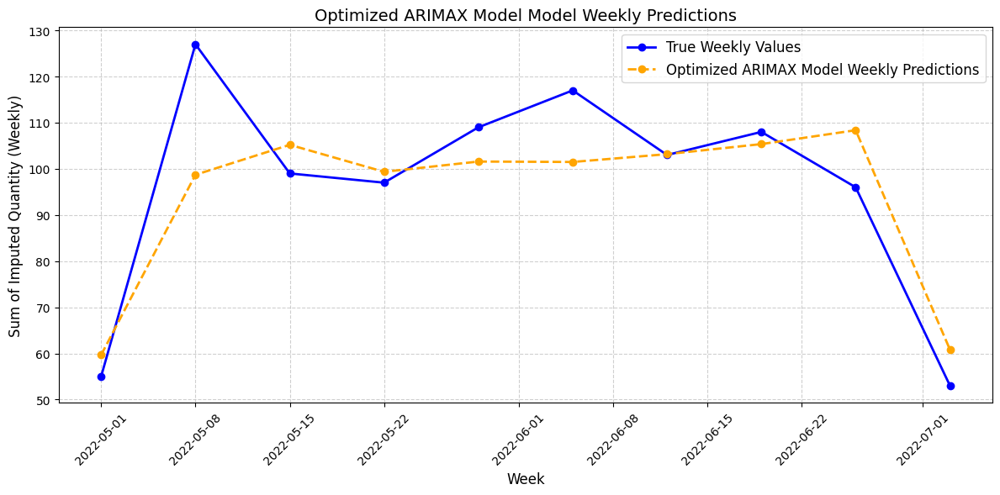

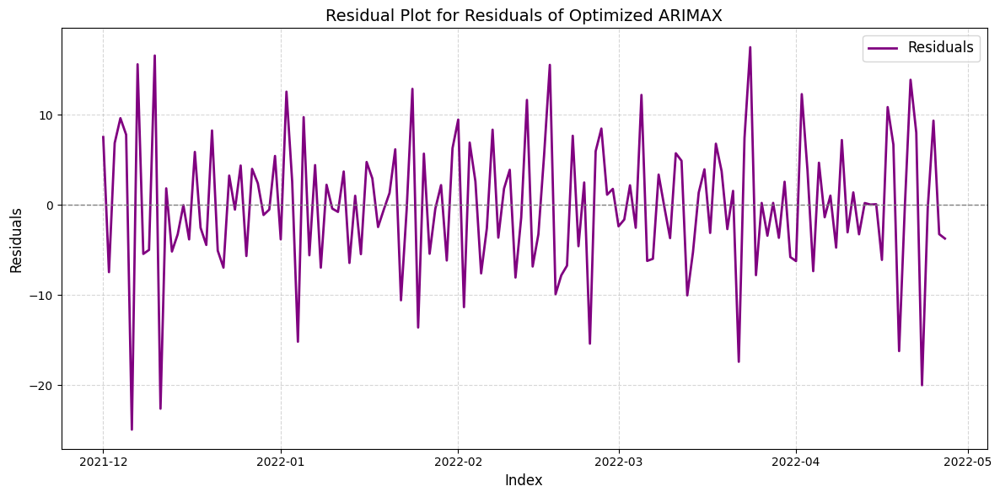

In [ ]:
# Define and fit the ARIMAX model using the best parameters from tuning
optimized_arimax_model = ARIMA(train,
                                order=(best_arimax_params['p'], best_arimax_params['d'], best_arimax_params['q']),
                                exog=train_exog)
optimized_arimax_model_fitted = optimized_arimax_model.fit()

# Forecast using the tuned ARIMAX model with external predictors
arimax_optimized_forecast = optimized_arimax_model_fitted.forecast(len(test), exog=test_exog)

# Calculate and display the evaluation metrics for the tuned ARIMAX model
arimax_optimized_metrics = calculate_metrics(test, arimax_optimized_forecast)
print("Evaluation Metrics for Tuned ARIMAX:", arimax_optimized_metrics)

# Visualize the predictions made by the tuned ARIMAX model
plot_model_predictions(test, arimax_optimized_forecast, "Optimized ARIMAX Model")

# Compare weekly performance between actual values and tuned ARIMAX predictions
plot_weekly_comparison(test, arimax_optimized_forecast, "Optimized ARIMAX Model")

# Display the residuals of the tuned ARIMAX model
plot_residuals(optimized_arimax_model_fitted, "Residuals of Optimized ARIMAX")


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  

ARIMAX Tuned Metrics: (3.071844476867793, 3.93389387882544, 15.475521049860266, 22.162717317032335)


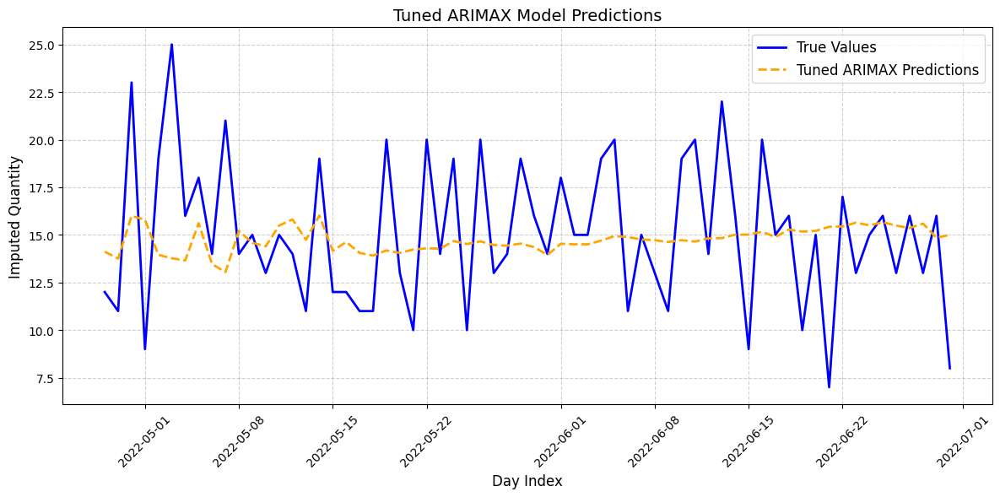

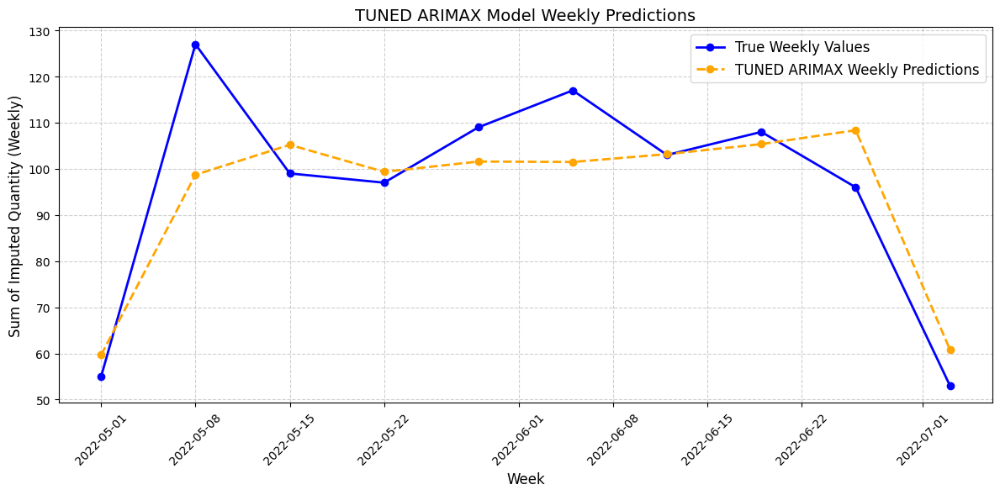

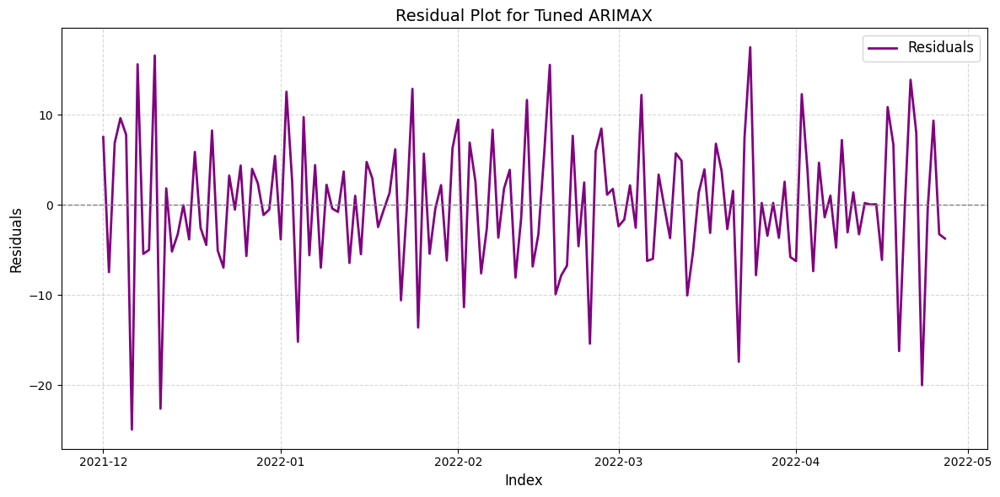

In [ ]:
arimax_tuned_model = ARIMA(train,
                           order=(best_arimax_params['p'], best_arimax_params['d'], best_arimax_params['q']),
                           exog=train_exog)
arimax_tuned_model_fit = arimax_tuned_model.fit()

# Predict with ARIMAX tuned model
arimax_tuned_predictions = arimax_tuned_model_fit.forecast(len(test), exog=test_exog)

# Evaluate ARIMAX tuned model
arimax_tuned_metrics = calculate_metrics(test, arimax_tuned_predictions)
print("ARIMAX Tuned Metrics:", arimax_tuned_metrics)

# Plot ARIMAX tuned predictions
plot_model_predictions(test, arimax_tuned_predictions, "Tuned ARIMAX")

plot_weekly_comparison(test,arimax_tuned_predictions, "TUNED ARIMAX")
plot_residuals(arimax_tuned_model_fit, "Tuned ARIMAX")

SARIMAX MODEL:

A SARIMAX (Seasonal AutoRegressive Integrated Moving Average with eXogenous variables) model is an extension of the SARIMA model that includes exogenous variables, which are external predictors that might influence the time series. This model can handle both seasonal effects and external predictors, which makes it useful for more complex time series data that depends not only on past values but also on external factors

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


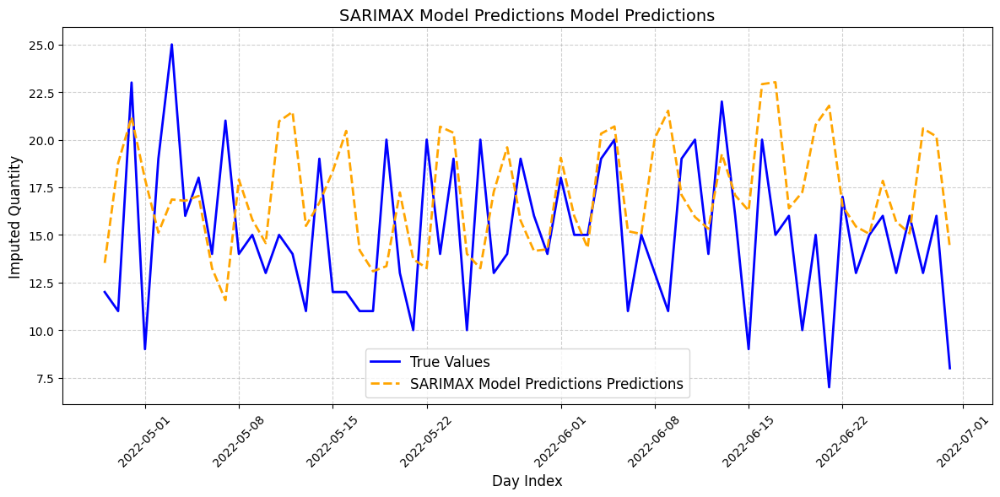

SARIMAX Model Performance Metrics: (4.007631049685432, 5.0758500683033505, 25.764253915895125, 31.355485417939597)


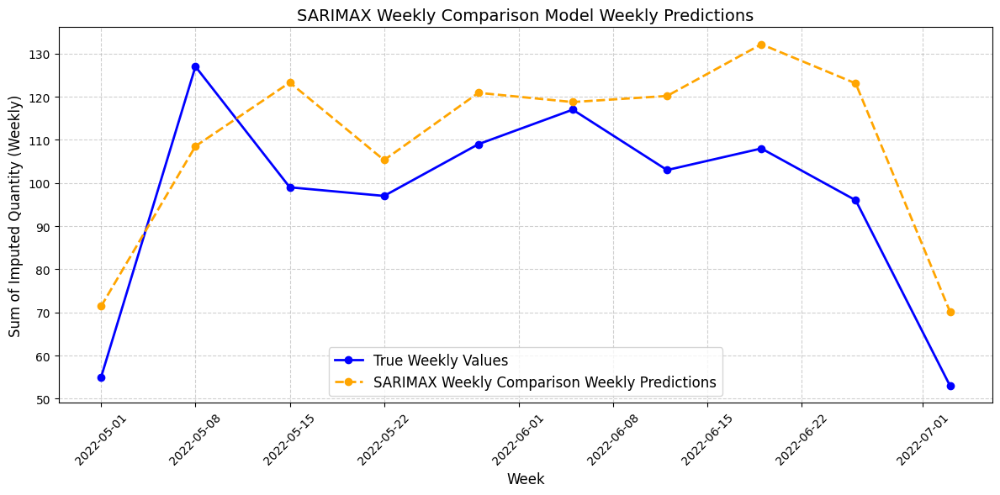

In [ ]:
# Define and fit the SARIMAX model with specified parameters, including external factors
sarimax_model_configured = SARIMAX(train,
                                   order=(1, 1, 1),
                                   seasonal_order=(1, 1, 1, 12),
                                   exog=train_exog)
sarimax_model_fitted = sarimax_model_configured.fit()

# Make predictions with the SARIMAX model using the test data and external variables
sarimax_forecasts = sarimax_model_fitted.forecast(len(test), exog=test_exog)

# Plot the actual vs predicted values
plot_model_predictions(test, sarimax_forecasts, "SARIMAX Model Predictions")

# Evaluate the model by calculating performance metrics
sarimax_performance_metrics = calculate_metrics(test, sarimax_forecasts)
print("SARIMAX Model Performance Metrics:", sarimax_performance_metrics)

# Compare weekly predictions with the actual values
plot_weekly_comparison(test, sarimax_forecasts, "SARIMAX Weekly Comparison")


In [ ]:
# Define objective function for SARIMAX hyperparameter optimization
def optimize_sarimax(trial):
    # Suggest hyperparameters for the ARIMA and seasonal components
    p = trial.suggest_int("p", 1, 5)
    d = trial.suggest_int("d", 0, 2)
    q = trial.suggest_int("q", 1, 5)
    P = trial.suggest_int("P", 0, 2)
    D = trial.suggest_int("D", 0, 1)
    Q = trial.suggest_int("Q", 0, 2)
    s = 12  # Seasonal cycle is fixed for monthly data

    # Fit the SARIMAX model using the parameters suggested by Optuna
    sarimax_model = SARIMAX(train,
                            order=(p, d, q),
                            seasonal_order=(P, D, Q, s),
                            enforce_stationarity=True,
                            enforce_invertibility=True,
                            exog=train_exog)
    sarimax_model_fit = sarimax_model.fit()

    # Forecast the values for the test period
    predicted_values = sarimax_model_fit.forecast(len(test), exog=test_exog)

    # Return RMSE to guide the optimization
    return np.sqrt(mean_squared_error(test, predicted_values))

# Set up and run the Optuna optimization for SARIMAX model hyperparameters
sarimax_study = optuna.create_study(direction='minimize')
sarimax_study.optimize(optimize_sarimax, n_trials=50)

# Retrieve the optimal parameters from the optimization study
optimal_sarimax_params = sarimax_study.best_params

# Display the best hyperparameters found for the SARIMAX model
print("Optimal SARIMAX Parameters:", optimal_sarimax_params)


[I 2024-12-18 15:14:15,012] A new study created in memory with name: no-name-f9b66205-babd-4ce3-b622-71e5764daa7f
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2024-12-18 15:14:25,447] Trial 0 finished with value: 7.659216166605235 and parameters: {'p': 2, 'd': 0, 'q': 4, 'P': 0, 'D': 0, 'Q': 1}. Best is trial 0 with value: 7.659216166605235.
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.p

Optimal SARIMAX Parameters: {'p': 5, 'd': 1, 'q': 3, 'P': 1, 'D': 0, 'Q': 2}


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimized SARIMAX Model Metrics: (3.1015624724758517, 3.8396583488494205, 14.742976235889058, 22.54326342345175)


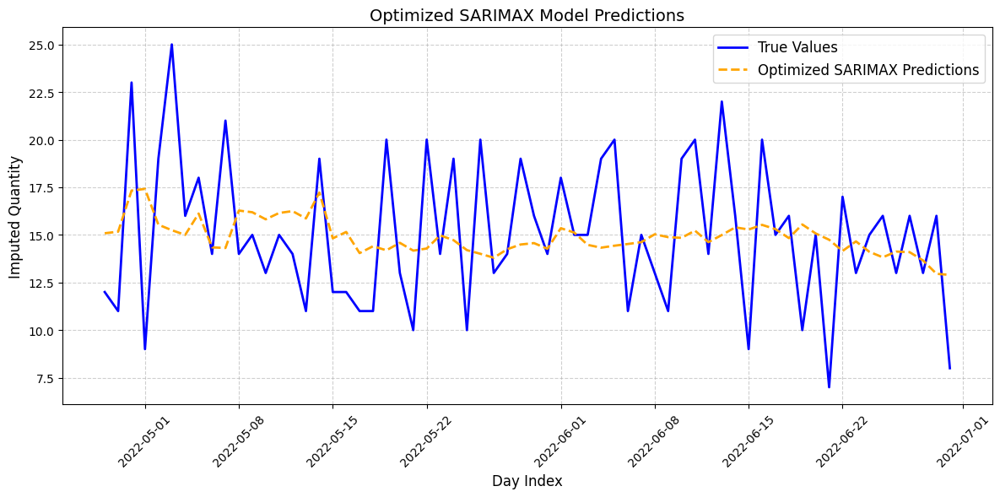

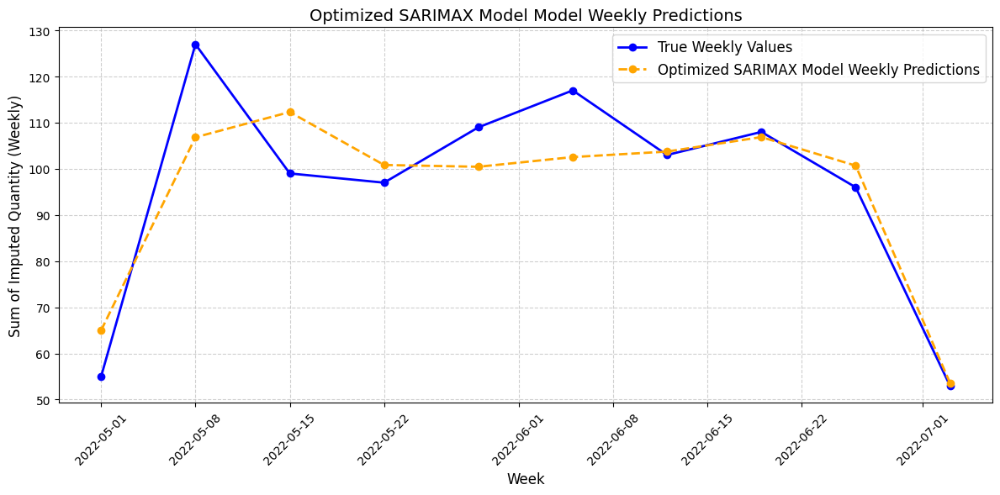

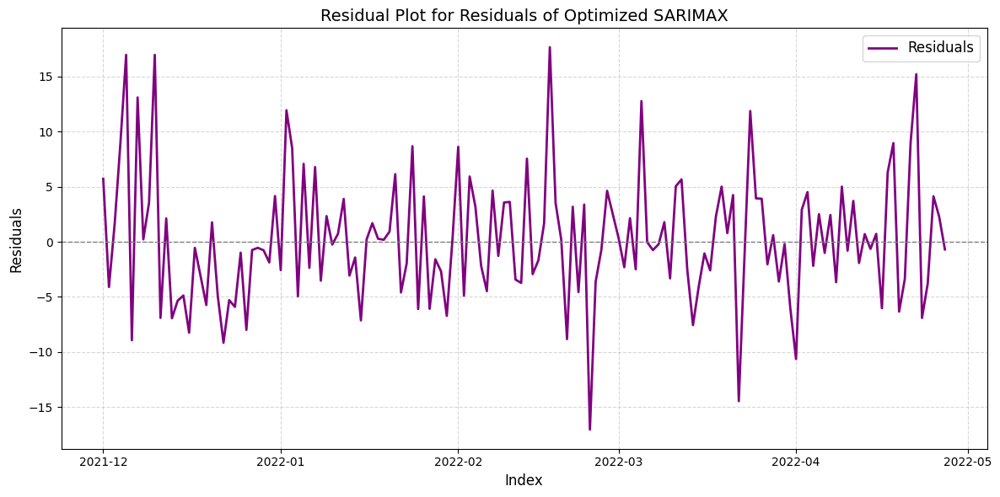

In [ ]:
# Instantiate and fit the SARIMAX model using the optimized parameters
optimized_sarimax_model = SARIMAX(train,
                                   order=(best_sarimax_params['p'], best_sarimax_params['d'], best_sarimax_params['q']),
                                   seasonal_order=(best_sarimax_params['P'], best_sarimax_params['D'], best_sarimax_params['Q'], 12),
                                   exog=train_exog)
optimized_sarimax_model_fitted = optimized_sarimax_model.fit()

# Generate predictions using the tuned SARIMAX model
sarimax_optimized_forecast = optimized_sarimax_model_fitted.forecast(len(test), exog=test_exog)

# Compute and print the evaluation metrics for the tuned SARIMAX model
sarimax_optimized_metrics = calculate_metrics(test, sarimax_optimized_forecast)
print("Optimized SARIMAX Model Metrics:", sarimax_optimized_metrics)

# Visualize the forecast results from the tuned SARIMAX model
plot_model_predictions(test, sarimax_optimized_forecast, "Optimized SARIMAX")

# Compare the weekly results of actual vs. predicted values from the SARIMAX model
plot_weekly_comparison(test, sarimax_optimized_forecast, "Optimized SARIMAX Model")

# Display the residual plot for the tuned SARIMAX model
plot_residuals(optimized_sarimax_model_fitted, "Residuals of Optimized SARIMAX")


In [ ]:
!pip install optuna
import optuna
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
import numpy as np

# ... (Your existing code for data loading, preprocessing, and train/test split)

# Define objective function for SARIMAX hyperparameter optimization
def optimize_sarimax(trial):
    # Suggest hyperparameters for the ARIMA and seasonal components
    p = trial.suggest_int("p", 1, 5)
    d = trial.suggest_int("d", 0, 2)
    q = trial.suggest_int("q", 1, 5)
    P = trial.suggest_int("P", 0, 2)
    D = trial.suggest_int("D", 0, 1)
    Q = trial.suggest_int("Q", 0, 2)
    s = 12  # Seasonal cycle is fixed for monthly data

    # Fit the SARIMAX model using the parameters suggested by Optuna
    sarimax_model = SARIMAX(train,
                            order=(p, d, q),
                            seasonal_order=(P, D, Q, s),
                            enforce_stationarity=True,
                            enforce_invertibility=True,
                            exog=train_exog)
    sarimax_model_fit = sarimax_model.fit()

    # Forecast the values for the test period
    predicted_values = sarimax_model_fit.forecast(len(test), exog=test_exog)

    # Return RMSE to guide the optimization
    return np.sqrt(mean_squared_error(test, predicted_values))

# Set up and run the Optuna optimization for SARIMAX model hyperparameters
sarimax_study = optuna.create_study(direction='minimize')
sarimax_study.optimize(optimize_sarimax, n_trials=50)  # Adjust n_trials as needed

# Retrieve the optimal parameters from the optimization study
best_sarimax_params = sarimax_study.best_params  # Assign the result to best_sarimax_params

# Display the best hyperparameters found for the SARIMAX model
print("Optimal SARIMAX Parameters:", best_sarimax_params)

# Instantiate and fit the SARIMAX model using the optimized parameters
optimized_sarimax_model = SARIMAX(train,
                                   order=(best_sarimax_params['p'], best_sarimax_params['d'], best_sarimax_params['q']),
                                   seasonal_order=(best_sarimax_params['P'], best_sarimax_params['D'], best_sarimax_params['Q'], 12),
                                   exog=train_exog)
optimized_sarimax_model_fitted = optimized_sarimax_model.fit()

# ... (Rest of your code for prediction and evaluation)

[I 2024-12-18 15:21:53,156] A new study created in memory with name: no-name-31a1e9c0-fb47-45b0-aeb5-eff183f4b79e
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
[I 2024-12-18 15:21:56,513] Trial 0 finished with value: 8.326631933960977 and parameters: {'p': 5, 'd': 0, 'q': 1, 'P': 0, 'D': 1, 'Q': 0}. Best is trial 0 with value: 8.326631933960977.
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.p

Optimal SARIMAX Parameters: {'p': 3, 'd': 1, 'q': 1, 'P': 1, 'D': 0, 'Q': 1}


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


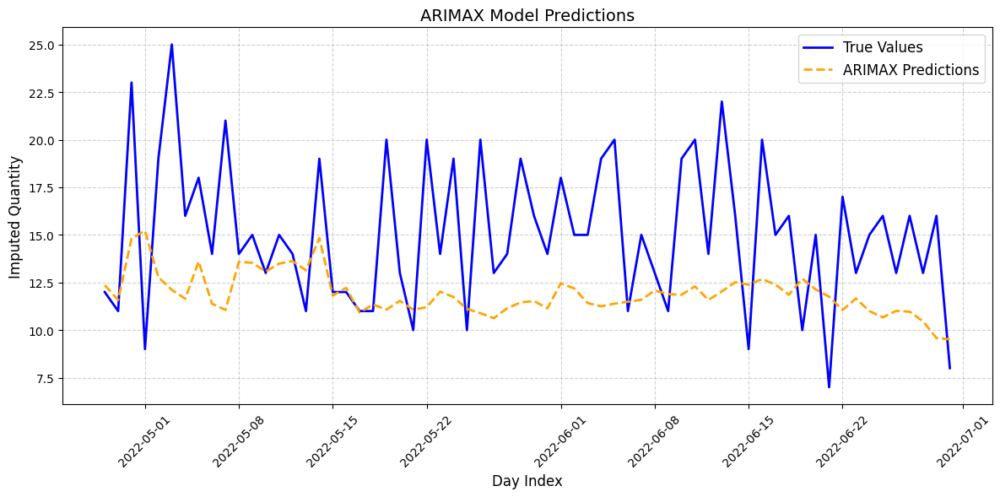

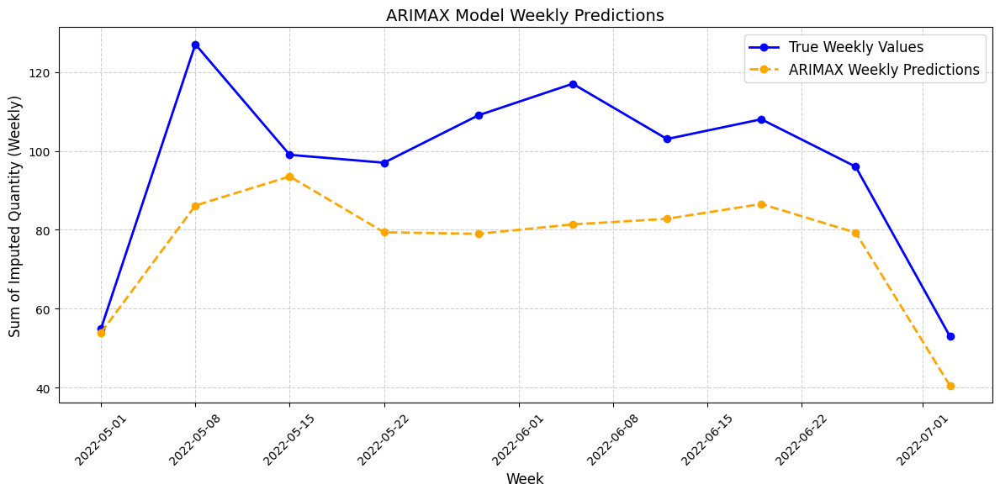

In [ ]:

arimax_model = ARIMA(train, order=(1, 1, 1), exog=train_exog)  # ARIMAX includes exogenous variables
arimax_model_fit = arimax_model.fit()
arimax_predictions = arimax_model_fit.forecast(len(test), exog=test_exog)

# Plotting the predictions
plot_model_predictions(test, arimax_predictions, "ARIMAX")

# Calculate metrics
arimax_metrics = calculate_metrics(test, arimax_predictions)
plot_weekly_comparison(test,arimax_predictions, "ARIMAX")

In [ ]:
def arimax_objective(trial):
    # Suggest values for the ARIMAX parameters: p, d, q
    p_value = trial.suggest_int("p", 1, 5)
    d_value = trial.suggest_int("d", 0, 2)
    q_value = trial.suggest_int("q", 1, 5)

    # Instantiate and fit the ARIMAX model using the suggested parameters
    arimax_model = ARIMA(train, order=(p_value, d_value, q_value), exog=train_exog)
    fitted_model = arimax_model.fit()

    # Forecast using the fitted model
    forecasted_values = fitted_model.forecast(len(test), exog=test_exog)

    # Calculate RMSE and return as the objective to minimize
    return np.sqrt(mean_squared_error(test, forecasted_values))

# Set up Optuna optimization for ARIMAX model
arimax_optimization_study = optuna.create_study(direction='minimize')
arimax_optimization_study.optimize(arimax_objective, n_trials=50)

# Get the best parameters from the optimization study
optimal_arimax_params = arimax_optimization_study.best_params

# Output the optimal parameters for ARIMAX
print("Optimal ARIMAX Parameters:", optimal_arimax_params)


[I 2024-12-18 15:49:35,568] A new study created in memory with name: no-name-a5276536-f745-49d7-bf6c-f4d7b0393cf4
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmode

Optimal ARIMAX Parameters: {'p': 2, 'd': 2, 'q': 5}


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  

Optimized ARIMAX Model Metrics: (3.071844476867793, 3.93389387882544, 15.475521049860266, 22.162717317032335)


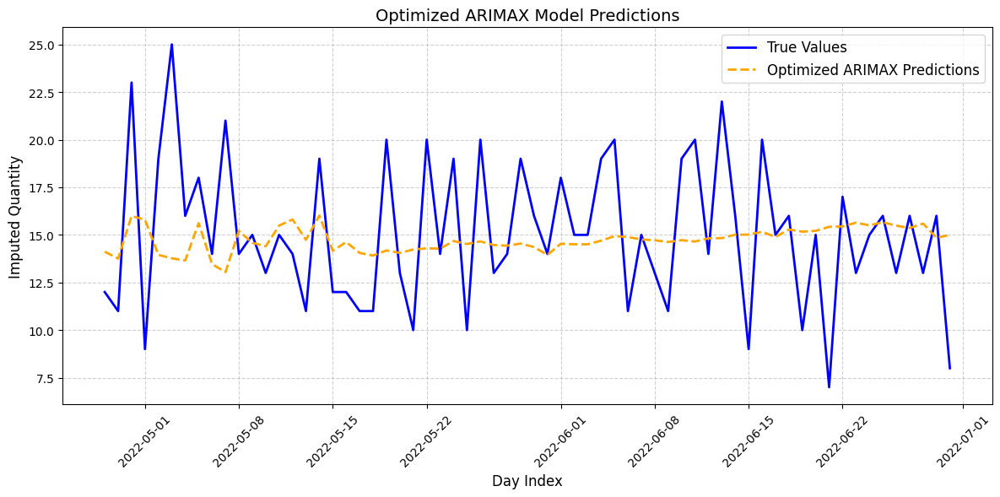

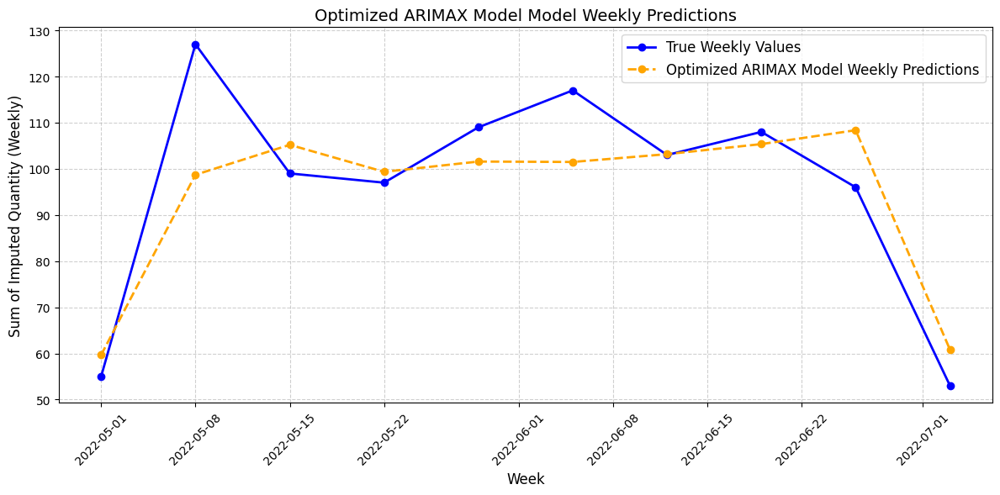

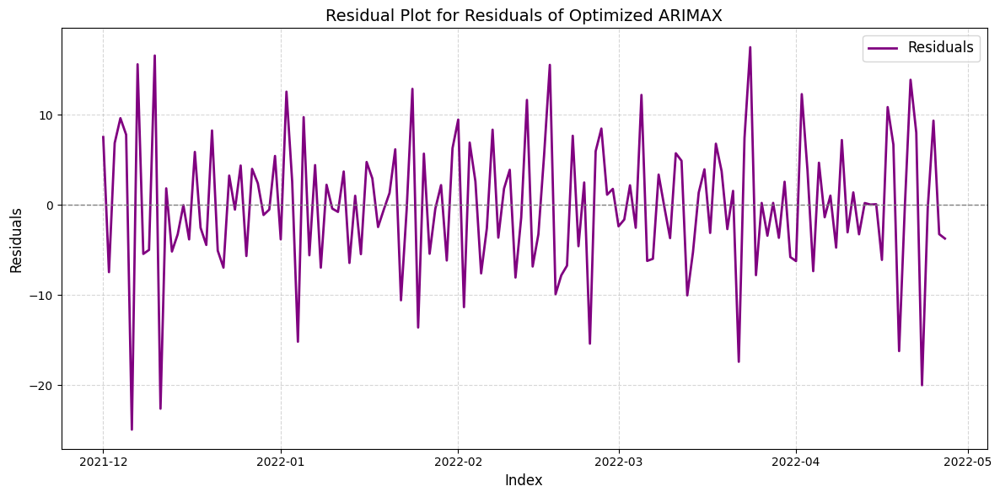

In [ ]:
# Train the ARIMAX model using the optimized hyperparameters
optimized_arimax_model = ARIMA(train,
                                order=(best_arimax_params['p'], best_arimax_params['d'], best_arimax_params['q']),
                                exog=train_exog)
fitted_arimax_model = optimized_arimax_model.fit()

# Generate predictions using the tuned ARIMAX model
arimax_predictions_optimized = fitted_arimax_model.forecast(len(test), exog=test_exog)

# Calculate evaluation metrics for the tuned ARIMAX model
optimized_arimax_metrics = calculate_metrics(test, arimax_predictions_optimized)
print("Optimized ARIMAX Model Metrics:", optimized_arimax_metrics)

# Plot the predictions from the tuned ARIMAX model
plot_model_predictions(test, arimax_predictions_optimized, "Optimized ARIMAX")

# Create a weekly comparison of the true and predicted values
plot_weekly_comparison(test, arimax_predictions_optimized, "Optimized ARIMAX Model")

# Display the residuals from the optimized ARIMAX model
plot_residuals(fitted_arimax_model, "Residuals of Optimized ARIMAX")


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


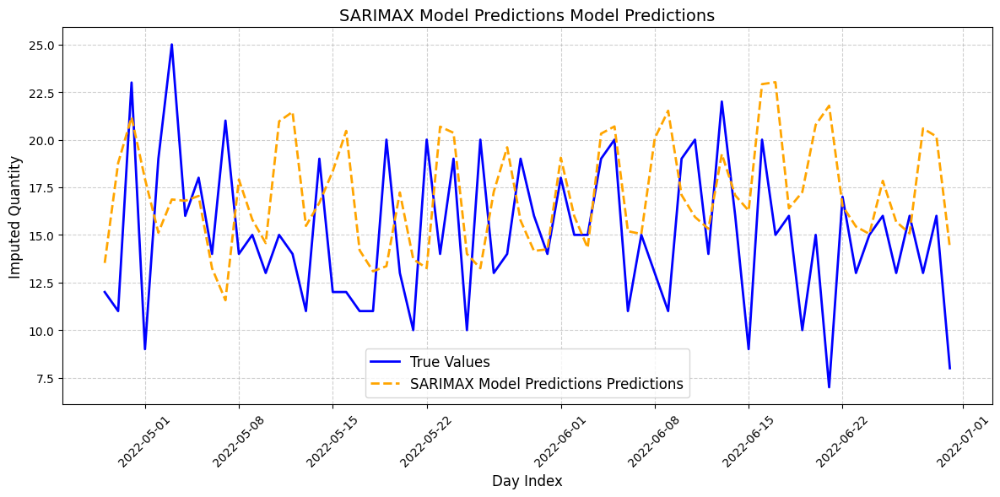

SARIMAX Model Metrics: (4.007631049685432, 5.0758500683033505, 25.764253915895125, 31.355485417939597)


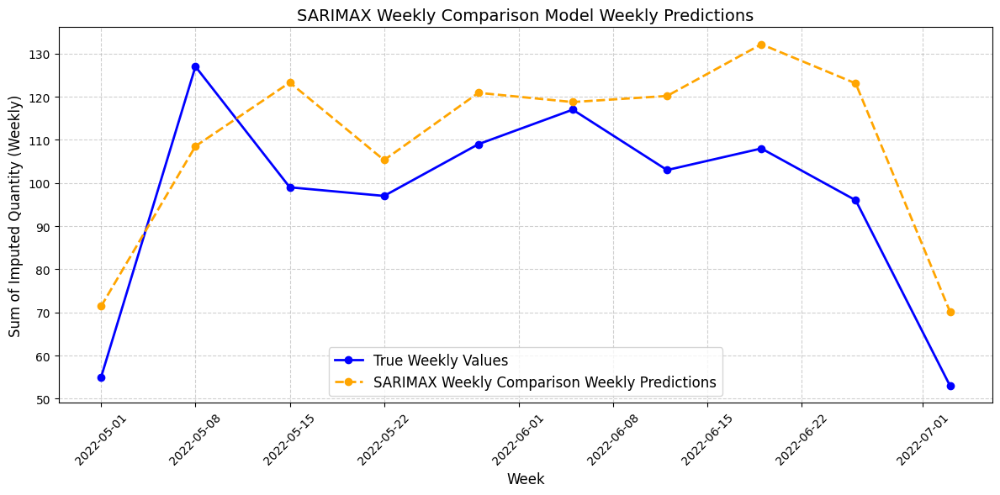

In [ ]:
# Define and fit the SARIMAX model with exogenous variables
seasonal_arimax_model = SARIMAX(train,
                                order=(1, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                exog=train_exog)  # Including external features
seasonal_arimax_fitted = seasonal_arimax_model.fit()

# Forecast using the SARIMAX model with exogenous predictors
sarimax_forecast = seasonal_arimax_fitted.forecast(len(test), exog=test_exog)

# Visualizing the SARIMAX model predictions
plot_model_predictions(test, sarimax_forecast, "SARIMAX Model Predictions")

# Calculate and print the performance metrics for the SARIMAX model
sarimax_model_metrics = calculate_metrics(test, sarimax_forecast)
print("SARIMAX Model Metrics:", sarimax_model_metrics)

# Plot weekly comparison between actual and SARIMAX predictions
plot_weekly_comparison(test, sarimax_forecast, "SARIMAX Weekly Comparison")


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Evaluation Metrics for Tuned SARIMAX: (3.1015624724758517, 3.8396583488494205, 14.742976235889058, 22.54326342345175)


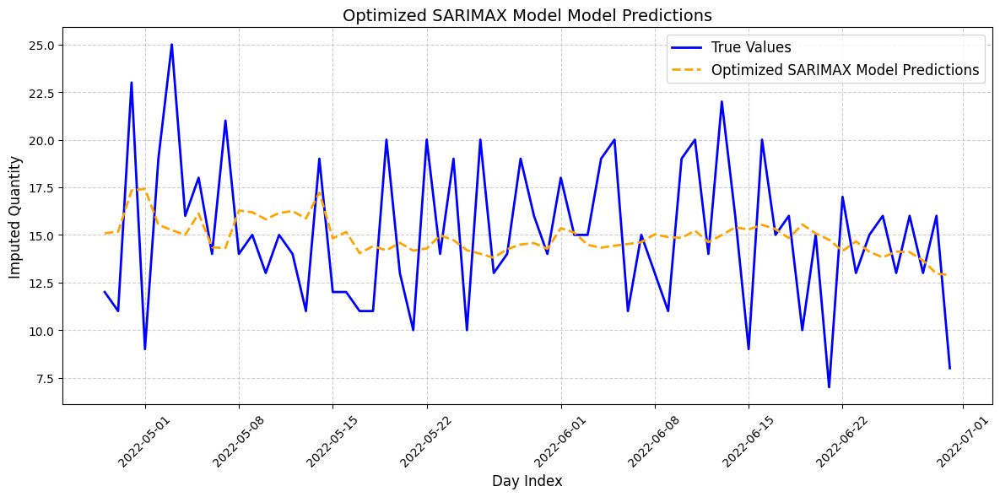

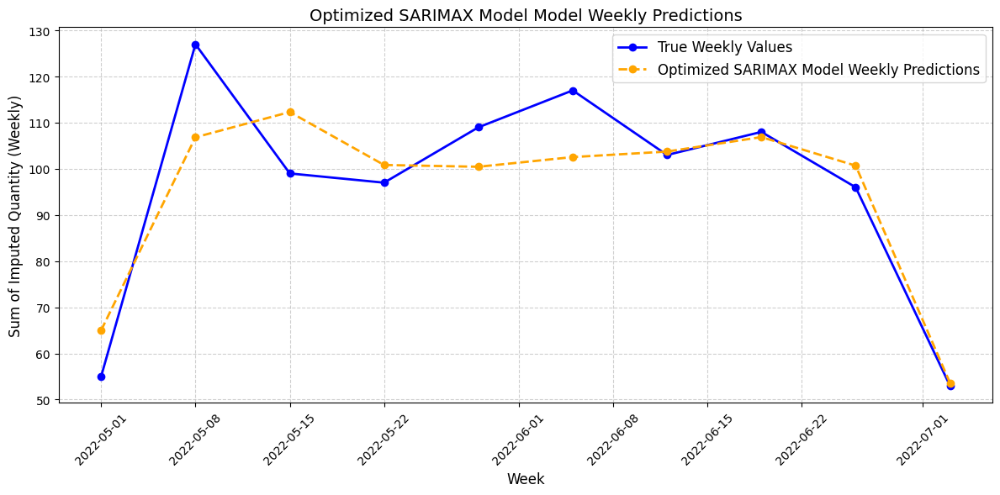

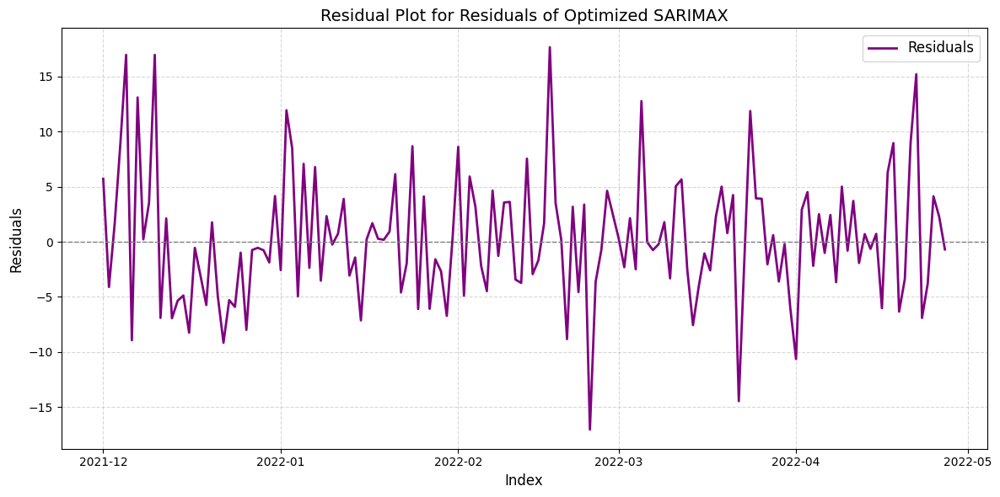

In [ ]:
# Define and fit the SARIMAX model using the optimized hyperparameters
optimized_sarimax_model = SARIMAX(train,
                                   order=(best_sarimax_params['p'], best_sarimax_params['d'], best_sarimax_params['q']),
                                   seasonal_order=(best_sarimax_params['P'], best_sarimax_params['D'], best_sarimax_params['Q'], 12),
                                   exog=train_exog)
optimized_sarimax_model_fitted = optimized_sarimax_model.fit()

# Generate predictions using the tuned SARIMAX model
sarimax_optimized_forecast = optimized_sarimax_model_fitted.forecast(len(test), exog=test_exog)

# Calculate the evaluation metrics for the tuned SARIMAX model
sarimax_optimized_metrics = calculate_metrics(test, sarimax_optimized_forecast)
print("Evaluation Metrics for Tuned SARIMAX:", sarimax_optimized_metrics)

# Plot the predictions made by the tuned SARIMAX model
plot_model_predictions(test, sarimax_optimized_forecast, "Optimized SARIMAX Model")

# Visualize the weekly comparison between actual values and SARIMAX predictions
plot_weekly_comparison(test, sarimax_optimized_forecast, "Optimized SARIMAX Model")

# Display the residuals of the tuned SARIMAX model
plot_residuals(optimized_sarimax_model_fitted, "Residuals of Optimized SARIMAX")


METRICS TABLES

In [ ]:
# Creating a DataFrame to display evaluation metrics before model hyperparameter tuning
pre_tuning_metrics = pd.DataFrame({
    "Model Type": ["AR", "MA", "ARIMA", "SARIMA", "ARIMAX", "SARIMAX"],
    "Mean Absolute Error (MAE)": [ar_metrics[0], ma_metrics[0], arima_metrics[0], sarima_metrics[0], arimax_metrics[0], sarimax_model_metrics[0]], # Changed sarimax_metrics to sarimax_model_metrics
    "Root Mean Squared Error (RMSE)": [ar_metrics[1], ma_metrics[1], arima_metrics[1], sarima_metrics[1], arimax_metrics[1], sarimax_model_metrics[1]], # Changed sarimax_metrics to sarimax_model_metrics
    "Mean Squared Error (MSE)": [ar_metrics[2], ma_metrics[2], arima_metrics[2], sarima_metrics[2], arimax_metrics[2], sarimax_model_metrics[2]], # Changed sarimax_metrics to sarimax_model_metrics
    "Mean Absolute Percentage Error (MAPE)": [ar_metrics[3], ma_metrics[3], arima_metrics[3], sarima_metrics[3], arimax_metrics[3], sarimax_model_metrics[3]], # Changed sarimax_metrics to sarimax_model_metrics
})

# Print the evaluation metrics before any hyperparameter optimization
print("Evaluation Metrics Before Hyperparameter Tuning")
print(pre_tuning_metrics)

Evaluation Metrics Before Hyperparameter Tuning
  Model Type  Mean Absolute Error (MAE)  Root Mean Squared Error (RMSE)  \
0         AR                   4.365227                        5.182116   
1         MA                   4.378502                        5.200607   
2      ARIMA                   5.330678                        6.287685   
3     SARIMA                   7.334760                        8.530141   
4     ARIMAX                   3.955373                        4.994683   
5    SARIMAX                   4.007631                        5.075850   

   Mean Squared Error (MSE)  Mean Absolute Percentage Error (MAPE)  
0                 26.854326                              36.132257  
1                 27.046311                              36.260240  
2                 39.534987                              44.213238  
3                 72.763304                              58.872156  
4                 24.946855                              24.342360  
5           

In [ ]:
# Create a DataFrame to store performance metrics after model tuning
evaluation_results = pd.DataFrame({
    "Model": ["AR", "MA", "ARIMA", "SARIMA", "ARIMAX", "SARIMAX"],
    "MAE": [ar_metrics[0], ma_metrics[0], arima_metrics[0], sarima_metrics[0], arimax_optimized_metrics[0], sarimax_optimized_metrics[0]],
    "RMSE": [ar_metrics[1], ma_metrics[1], arima_metrics[1], sarima_metrics[1], arimax_optimized_metrics[1], sarimax_optimized_metrics[1]],
    "MSE": [ar_metrics[2], ma_metrics[2], arima_metrics[2], sarima_metrics[2], arimax_optimized_metrics[2], sarimax_optimized_metrics[2]],
    "MAPE": [ar_metrics[3], ma_metrics[3], arima_metrics[3], sarima_metrics[3], arimax_optimized_metrics[3], sarimax_optimized_metrics[3]],
})

# Display the metrics after model tuning
print("Model Performance Metrics After Tuning:")
print(evaluation_results)


Model Performance Metrics After Tuning:
     Model       MAE      RMSE        MSE       MAPE
0       AR  4.365227  5.182116  26.854326  36.132257
1       MA  4.378502  5.200607  27.046311  36.260240
2    ARIMA  5.330678  6.287685  39.534987  44.213238
3   SARIMA  7.334760  8.530141  72.763304  58.872156
4   ARIMAX  3.071844  3.933894  15.475521  22.162717
5  SARIMAX  3.101562  3.839658  14.742976  22.543263


WEEK 5 & 6 : MULTIVARIATE REGRESSION(DYNAMIC)

Multivariate regression, often referred to as multiple regression when there are multiple independent variables, is a statistical method used to understand the relationship between two or more independent variables and a dependent variable. This method allows researchers to model complex relationships and make predictions based on multiple predictors.

In dynamic contexts, a dynamic multivariate regression model might account for changes over time, typically using techniques that handle time series data or other forms of data with temporal dependencies.

In [94]:
import pandas as pd
import os

# 1. Verify Google Drive mounting (if applicable):
#    from google.colab import drive
#    drive.mount('/content/drive')

# 2. Adjust the file path as needed:
file_path = '/content/drive/My Drive/infosys/Datasets/Feature_engineered_masterdata.xlsx' # Corrected the file path


# 3. Check if the file exists using os.path.exists():
if not os.path.exists(file_path):
    raise FileNotFoundError(f"File not found at: {file_path}")

# 4. Read the Excel file:
data = pd.read_excel(file_path)

In [99]:
import pandas as pd

# Assuming the file is in your 'infosys' folder as other files
file_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'  # Updated file path

# Check if the file exists before trying to load it
import os
if not os.path.exists(file_path):
    raise FileNotFoundError(f"Error: File not found at {file_path}")

# Load the dataset
data = pd.ExcelFile(file_path)
df = data.parse('Sheet1')

# Creating lagged features for Quantity, Clicks, and Impressions
for col in ['imputed_Quantity', 'Clicks', 'Impressions']:
    df[f'{col}_lag1'] = df[col].shift(1)  # Lag by 1 period
    df[f'{col}_lag2'] = df[col].shift(2)  # Lag by 2 periods

# Creating interaction features
df['Clicks_x_Weekend'] = df['Clicks'] * df['Weekend']
df['Impressions_x_Clicks'] = df['Impressions'] * df['Clicks']

# Drop rows with NaN values introduced by lagging
df = df.dropna()

# Save the updated dataframe back to the Excel file
updated_file_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'
df.to_excel(updated_file_path, index=False)

print(f"Updated file with lagged and interaction columns saved to: {updated_file_path}")

# Display the updated dataset
df.head()

Updated file with lagged and interaction columns saved to: /content/drive/MyDrive/infosys/enhanced_data.xlsx


,Day Index,Quantity,Impressions,Clicks,imputed_Quantity,Weekend,Day of Week,Month Name,Day_Friday,Day_Monday,...,Month_March,Month_May,imputed_Quantity_lag1,imputed_Quantity_lag2,Clicks_lag1,Clicks_lag2,Impressions_lag1,Impressions_lag2,Clicks_x_Weekend,Impressions_x_Clicks
2,2021-12-03,13,851,424,13,0,Friday,December,1,0,...,0,0,10.0,14.0,433.0,445.0,890.0,620.0,0,360824
3,2021-12-04,22,881,427,22,1,Saturday,December,0,0,...,0,0,13.0,10.0,424.0,433.0,851.0,890.0,427,376187
4,2021-12-05,33,678,451,24,1,Sunday,December,0,0,...,0,0,22.0,13.0,427.0,424.0,881.0,851.0,451,305778
5,2021-12-06,12,995,429,12,0,Monday,December,0,1,...,0,0,24.0,22.0,451.0,427.0,678.0,881.0,0,426855
6,2021-12-07,29,910,444,29,0,Tuesday,December,0,0,...,0,0,12.0,24.0,429.0,451.0,995.0,678.0,0,404040


In [102]:
# !pip install scikit-learn  # Ensures scikit-learn is installed
import pandas as pd
from sklearn.model_selection import train_test_split # Imports train_test_split

# Define predictors and target
# ... (Your existing code for X and y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Display shapes of the splits
X_train.shape, X_test.shape

((168, 8), (42, 8))

Mean Absolute Error (MAE): 3.709879371517007
Root Mean Squared Error (RMSE): 4.822850011069752
Mean Absolute Percentage Error (MAPE): 25.13%
R-squared (R^2): 0.075828721480235
Mean Difference: -0.12571337040711938


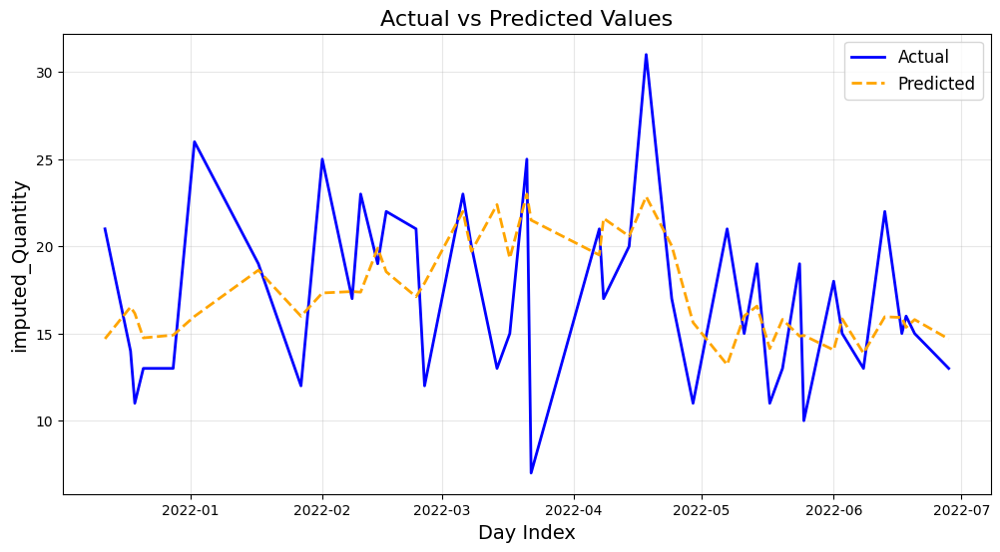

In [103]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset (use the appropriate file path or upload in Colab)
file_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'
data = pd.read_excel(file_path)

# Define features and target
target = "imputed_Quantity"
exclude_columns = ["Quantity", "Day Index", target]

# Drop exclude_columns before one-hot encoding
features = data.drop(columns=exclude_columns, errors="ignore")

# Identify categorical columns (object dtype)
categorical_cols = features.select_dtypes(include=['object']).columns

# Apply one-hot encoding using pd.get_dummies
features = pd.get_dummies(features, columns=categorical_cols, drop_first=True) # drop_first to avoid multicollinearity

# Ensure no missing values in features
features = features.fillna(0)
target_data = data[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target_data, test_size=0.2, random_state=42)

# Build and train the regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Compute metrics
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
r2 = r2_score(y_test, y_pred)
mean_difference = np.mean(y_test - y_pred)

# Display metrics
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")
print(f"R-squared (R^2): {r2}")
print(f"Mean Difference: {mean_difference}")

# Merge actual and predicted values with Day Index for plotting
day_index = data.loc[y_test.index, "Day Index"]
comparison_df = pd.DataFrame({
    "Day Index": day_index,
    "Actual": y_test,
    "Predicted": y_pred
}).sort_values(by="Day Index")

# Plot the line chart
plt.figure(figsize=(12, 6))
plt.plot(comparison_df["Day Index"], comparison_df["Actual"], label="Actual", color='blue', linewidth=2)
plt.plot(comparison_df["Day Index"], comparison_df["Predicted"], label="Predicted", color='orange', linestyle='--', linewidth=2)
plt.title('Actual vs Predicted Values', fontsize=16)
plt.xlabel('Day Index', fontsize=14)
plt.ylabel('imputed_Quantity', fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

Best Parameters: {'alpha': 0.01, 'solver': 'saga'}
Best Cross-Validation R2 Score: 0.09031209507014451
Mean Absolute Error (MAE): 3.6163602672002186
Root Mean Squared Error (RMSE): 4.457628055528592
Mean Absolute Percentage Error (MAPE): 23.57%
R-squared (R^2): 0.210499131408599
Mean Difference: 0.12184984612160556


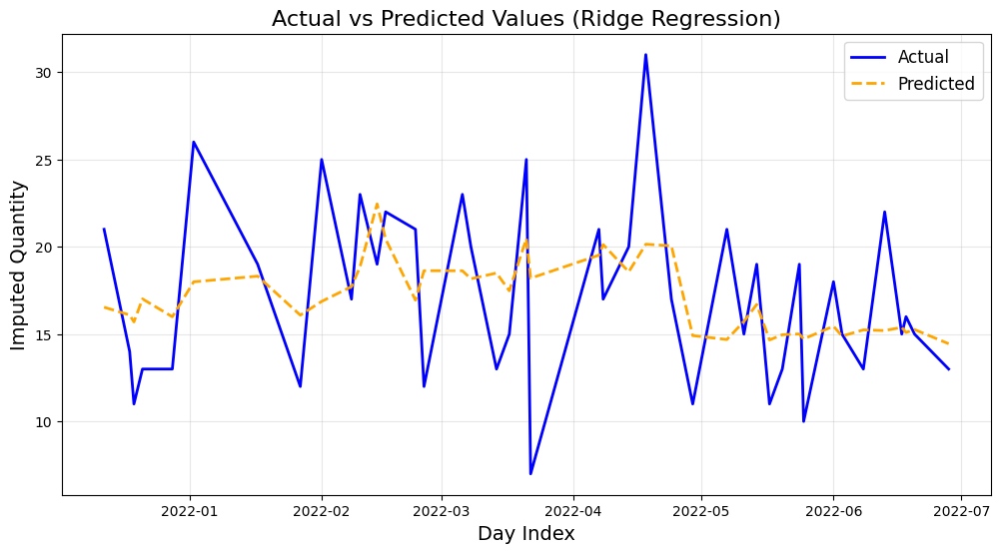

In [106]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Load the dataset
file_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'
data = pd.read_excel(file_path)

# Define target variable and columns to exclude
target_variable = "imputed_Quantity"
excluded_columns = ["Quantity", "Day Index", target_variable]

# Remove columns not needed for the model
features_data = data.drop(columns=excluded_columns, errors="ignore")

# Identify categorical variables for one-hot encoding
categorical_columns = features_data.select_dtypes(include=['object']).columns

# Apply one-hot encoding to categorical features
features_data = pd.get_dummies(features_data, columns=categorical_columns, drop_first=True)

# Handle missing values by filling with 0
features_data = features_data.fillna(0)

# Extract the target variable
target_values = data[target_variable]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features_data, target_values, test_size=0.2, random_state=42)

# Initialize the Ridge regression model
ridge_regression_model = Ridge()

# Define hyperparameters to tune
parameter_grid = {
    'alpha': [0.01, 0.1, 1.0, 10.0, 100.0],  # Regularization strengths
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'saga']  # Optimization solvers
}

# Perform grid search with cross-validation to find the best parameters
grid_search_model = GridSearchCV(estimator=ridge_regression_model, param_grid=parameter_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search_model.fit(X_train, y_train)

# Output the best parameters and the best R2 score from cross-validation
print(f"Best Parameters: {grid_search_model.best_params_}")
print(f"Best Cross-Validation R2 Score: {grid_search_model.best_score_}")

# Evaluate the best model on the test set
optimized_model = grid_search_model.best_estimator_
predictions = optimized_model.predict(X_test)

# Calculate performance metrics
mae = mean_absolute_error(y_test, predictions)
rmse = np.sqrt(mean_squared_error(y_test, predictions))
mape = np.mean(np.abs((y_test - predictions) / y_test)) * 100
r2 = r2_score(y_test, predictions)
mean_diff = np.mean(y_test - predictions)

# Display the computed metrics
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")
print(f"R-squared (R^2): {r2}")
print(f"Mean Difference: {mean_diff}")

# Create a comparison DataFrame to visualize results
day_indices = data.loc[y_test.index, "Day Index"]
comparison_data = pd.DataFrame({
    "Day Index": day_indices,
    "Actual": y_test,
    "Predicted": predictions
}).sort_values(by="Day Index")

# Plot actual vs predicted values over the Day Index
plt.figure(figsize=(12, 6))
plt.plot(comparison_data["Day Index"], comparison_data["Actual"], label="Actual", color='blue', linewidth=2)
plt.plot(comparison_data["Day Index"], comparison_data["Predicted"], label="Predicted", color='orange', linestyle='--', linewidth=2)
plt.title('Actual vs Predicted Values (Ridge Regression)', fontsize=16)
plt.xlabel('Day Index', fontsize=14)
plt.ylabel('Imputed Quantity', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()


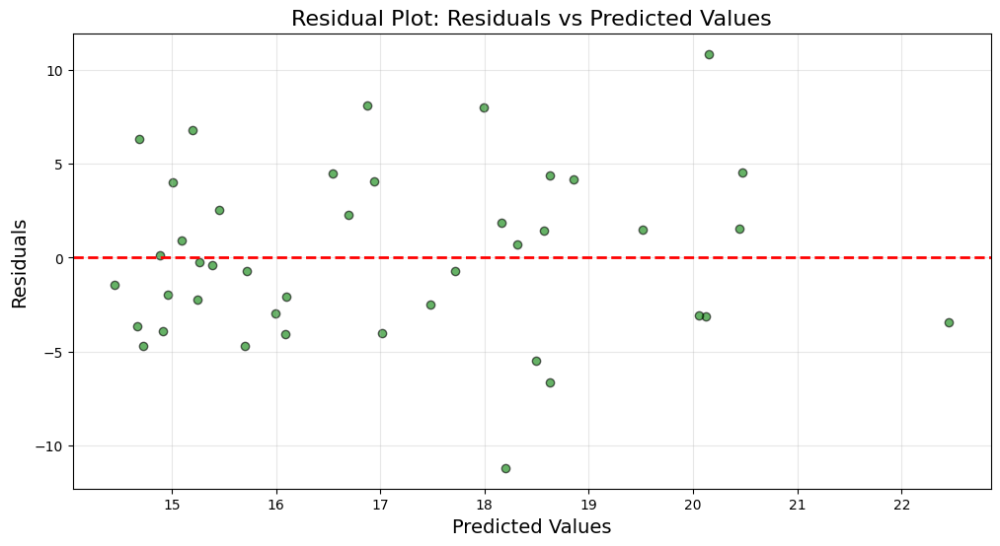

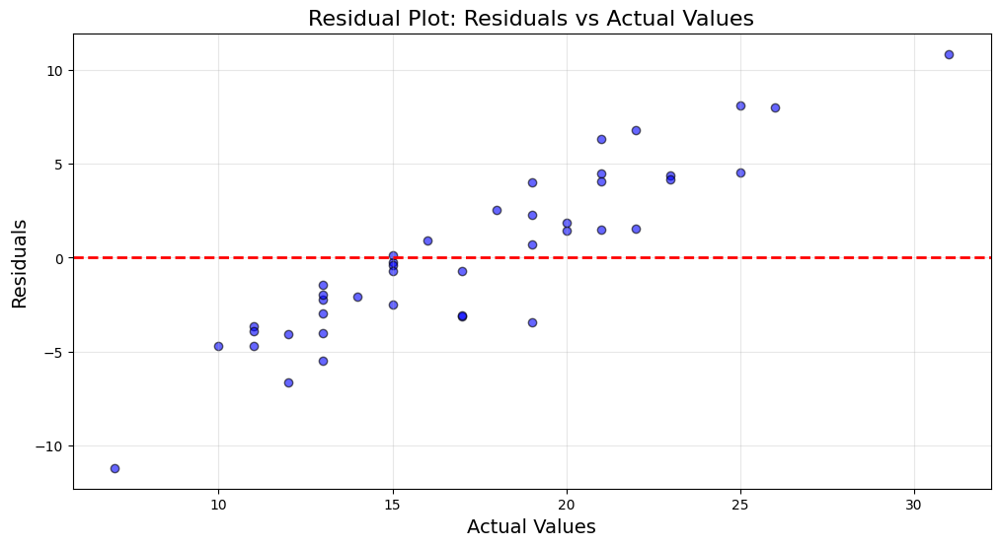

In [105]:
import matplotlib.pyplot as plt

# Calculate residuals
residuals = y_test - y_pred

# Residual plot: residuals vs predicted values
plt.figure(figsize=(12, 6))
plt.scatter(y_pred, residuals, alpha=0.6, edgecolors='k', color='green')
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Red horizontal line at 0 for reference
plt.title('Residual Plot: Residuals vs Predicted Values', fontsize=16)
plt.xlabel('Predicted Values', fontsize=14)
plt.ylabel('Residuals', fontsize=14)
plt.grid(True, alpha=0.3)  # Set grid with transparency
plt.show()

# Residual plot: residuals vs actual values
plt.figure(figsize=(12, 6))
plt.scatter(y_test, residuals, alpha=0.6, edgecolors='k', color='blue')
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)  # Red horizontal line at 0 for reference
plt.title('Residual Plot: Residuals vs Actual Values', fontsize=16)
plt.xlabel('Actual Values', fontsize=14)
plt.ylabel('Residuals', fontsize=14)
plt.grid(True, alpha=0.3)  # Set grid with transparency
plt.show()


#WEEK-7
• Compare analysis of model performance (metrics calculated like MAE, RMSE, MAPE) on
test data.


• Select the best performing models.


• Generate forecasts for future period.

FORECASTING

TO FIND THE BEST PARAMETERS OF SARIMAX MODEL

In [117]:
import warnings
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from itertools import product
from multiprocessing import Pool, cpu_count
import matplotlib.pyplot as plt

# Ignore warnings
warnings.filterwarnings('ignore')

# Load dataset
# Corrected file path:
file_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'  # Assuming 'enhanced_data.xlsx' is the intended file
data = pd.read_excel(file_path)

# Preprocess data
data['Day Index'] = pd.to_datetime(data['Day Index'])
data.set_index('Day Index', inplace=True)

# Split into train (90%) and test (10%)
train_size = int(len(data) * 0.9)
train = data.iloc[:train_size]
test = data.iloc[train_size:]

# Define exogenous variables
exog_train = train[['Impressions', 'Clicks', 'Month Name', 'Weekend', 'Day of Week']]
exog_test = test[['Impressions', 'Clicks', 'Month Name', 'Weekend', 'Day of Week']]

# Convert categorical variables using one-hot encoding
all_data = pd.concat([exog_train, exog_test])
all_data = pd.get_dummies(all_data, drop_first=True)

exog_train = all_data.iloc[:len(exog_train)]
exog_test = all_data.iloc[len(exog_train):]

# Ensure numeric dtype
exog_train = exog_train.astype(float)
exog_test = exog_test.astype(float)

# Define parameter ranges
p = range(0, 2)
d = range(0, 2)
q = range(0, 2)
P = range(0, 2)
D = range(0, 2)
Q = range(0, 2)
s = [6, 12]  # Seasonal periods

# Create all possible combinations of parameters
parameter_combinations = list(product(p, d, q, P, D, Q, s))

# Function to fit SARIMAX and calculate RMSE
def evaluate_sarimax(params):
    try:
        model = SARIMAX(
            train['imputed_Quantity'],
            exog=exog_train,
            order=(params[0], params[1], params[2]),
            seasonal_order=(params[3], params[4], params[5], params[6]),
            enforce_stationarity=False,
            enforce_invertibility=False
        ).fit(disp=False, maxiter=50)
        predictions = model.forecast(steps=len(test), exog=exog_test)
        rmse = np.sqrt(mean_squared_error(test['imputed_Quantity'], predictions))
        return (params, rmse)
    except Exception as e:
        return (params, float('inf'))

# Use multiprocessing to speed up the process
with Pool(cpu_count()) as pool:
    results = pool.map(evaluate_sarimax, parameter_combinations)

# Find the best parameters and RMSE
best_params, lowest_rmse = min(results, key=lambda x: x[1])

print(f"Best Parameters: {best_params}")
print(f"Lowest RMSE: {lowest_rmse:.4f}")

# Refit the model with best parameters
best_model = SARIMAX(
    train['imputed_Quantity'],
    exog=exog_train,
    order=(best_params[0], best_params[1], best_params[2]),
    seasonal_order=(best_params[3], best_params[4], best_params[5], best_params[6]),
    enforce_stationarity=False,
    enforce_invertibility=False
).fit(disp=False, maxiter=50)

# Predict and forecast
predictions = best_model.forecast(steps=len(test), exog=exog_test)

# Forecast additional 2 months (8 weeks) beyond the test data
future_exog = exog_test.iloc[:8]  # Assuming exog_test for 8 weeks is similar
future_forecast = best_model.forecast(steps=8, exog=future_exog)

Best Parameters: (0, 0, 0, 0, 1, 1, 6)
Lowest RMSE: 3.0931


WEEKELY FORECASTING USING SARIMAX MODEL

Model Performance Metrics:
MAE: 2.6064
RMSE: 3.1096
MAPE: 22.13%
R^2: 0.3446


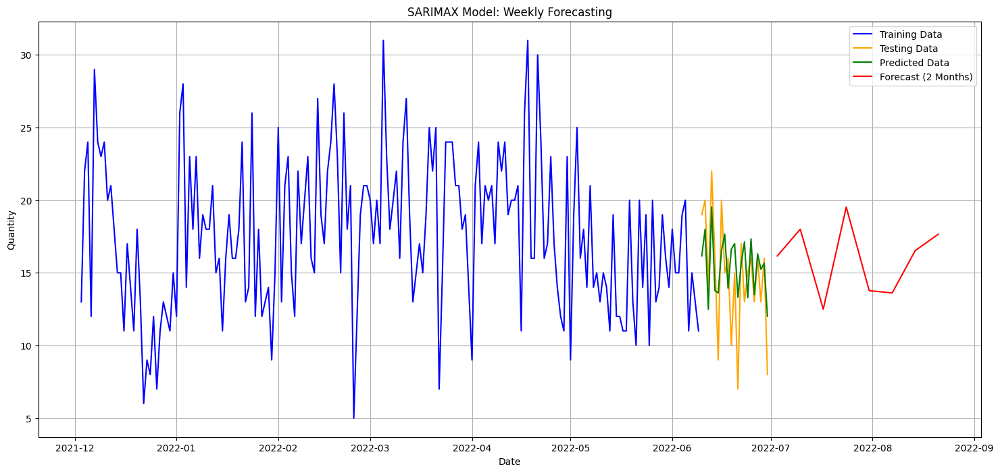

Weekly Forecasted `imputed_Quantity` for the Next 2 Months (8 Weeks):
            Forecasted_Quantity
Date                           
2022-07-03            16.161028
2022-07-10            18.000830
2022-07-17            12.495753
2022-07-24            19.522923
2022-07-31            13.771510
2022-08-07            13.617209
2022-08-14            16.528298
2022-08-21            17.653838


In [124]:
import warnings
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Suppress warnings to keep the output clean
warnings.filterwarnings('ignore')

# Load the dataset from the specified file path
file_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'  # Path to the Excel file
data = pd.read_excel(file_path)

# Preprocess the data
data['Day Index'] = pd.to_datetime(data['Day Index'])  # Convert 'Day Index' to datetime type
data.set_index('Day Index', inplace=True)  # Set 'Day Index' as the index

# Split the data into training (90%) and testing (10%) sets
train_size = int(len(data) * 0.9)  # 90% for training
train = data.iloc[:train_size]
test = data.iloc[train_size:]

# Define exogenous variables (external factors/features)
exog_train = train[['Impressions', 'Clicks', 'Month Name', 'Weekend', 'Day of Week']]
exog_test = test[['Impressions', 'Clicks', 'Month Name', 'Weekend', 'Day of Week']]

# Perform one-hot encoding on categorical variables
all_data = pd.concat([exog_train, exog_test])
all_data = pd.get_dummies(all_data, drop_first=True)  # Drop the first category to avoid multicollinearity

# Split the encoded data back into training and testing sets
exog_train = all_data.iloc[:len(exog_train)]
exog_test = all_data.iloc[len(exog_train):]

# Ensure that the exogenous data is of numeric type
exog_train = exog_train.astype(float)
exog_test = exog_test.astype(float)

# Define the SARIMAX model with the best parameters (e.g., from previous model selection)
sarimax_model = SARIMAX(
    train['imputed_Quantity'],
    exog=exog_train,
    order=(0, 0, 1),  # ARIMA order: p=0, d=0, q=1
    seasonal_order=(0, 1, 1, 6),  # Seasonal order: P=0, D=1, Q=1, s=6 (weekly seasonality)
    enforce_stationarity=False,
    enforce_invertibility=False
)

# Fit the model
fitted_model = sarimax_model.fit(disp=False, maxiter=50)

# Forecast on the test set
forecast_steps = len(test)  # Number of time steps to forecast
predictions = fitted_model.forecast(steps=forecast_steps, exog=exog_test)

# Forecast additional 8 weeks (2 months) beyond the test data
future_exog = exog_test.iloc[:8]  # Exogenous data for 8 future weeks
future_forecast = fitted_model.forecast(steps=8, exog=future_exog)

# Calculate performance metrics
mae = mean_absolute_error(test['imputed_Quantity'], predictions)  # Mean Absolute Error
rmse = np.sqrt(mean_squared_error(test['imputed_Quantity'], predictions))  # Root Mean Squared Error
mape = np.mean(np.abs((test['imputed_Quantity'] - predictions) / test['imputed_Quantity'])) * 100  # Mean Absolute Percentage Error
r2 = r2_score(test['imputed_Quantity'], predictions)  # R-squared

# Output the model performance metrics
print(f"Model Performance Metrics:\nMAE: {mae:.4f}\nRMSE: {rmse:.4f}\nMAPE: {mape:.2f}%\nR^2: {r2:.4f}")

# Plot the training, test, predicted, and future forecast data
plt.figure(figsize=(18, 8))

# Plot the training data
plt.plot(train['imputed_Quantity'], label='Training Data', color='blue')

# Plot the testing data
plt.plot(test['imputed_Quantity'], label='Testing Data', color='orange')

# Plot the predicted values
plt.plot(test.index, predictions, label='Predicted Data', color='green')

# Plot the future forecast values
future_index = pd.date_range(start=test.index[-1] + pd.Timedelta(days=1), periods=8, freq='W')  # Future 8 weeks
plt.plot(future_index, future_forecast, label='Forecast (2 Months)', color='red')

# Customize the plot
plt.title('SARIMAX Model: Weekly Forecasting')
plt.xlabel('Date')
plt.ylabel('Quantity')
plt.legend()
plt.grid(True)
plt.show()

# Create a DataFrame for the forecasted future values for better display
future_forecast_df = pd.DataFrame({
    'Date': future_index,
    'Forecasted_Quantity': future_forecast
})
future_forecast_df.set_index('Date', inplace=True)

# Print the forecasted future values
print("Weekly Forecasted `imputed_Quantity` for the Next 2 Months (8 Weeks):")
print(future_forecast_df)


DAILY FORECASTING

Daily Forecasted `imputed_Quantity` for 2 Months (60 Days):
            Forecasted_Quantity
Date                           
2022-07-01            16.161028
2022-07-02            18.000830
2022-07-03            12.495753
2022-07-04            19.522923
2022-07-05            13.771510
2022-07-06            13.617209
2022-07-07            16.528298
2022-07-08            17.653838
2022-07-09            13.949791
2022-07-10            16.626755
2022-07-11            17.010643
2022-07-12            13.312792
2022-07-13            15.637799
2022-07-14            17.134615
2022-07-15            13.280798
2022-07-16            17.330584
2022-07-17            13.494741
2022-07-18            16.309984
2022-07-19            15.240794
2022-07-20            15.655802
2022-07-21            12.007275
2022-07-22            17.153226
2022-07-23            15.051746
2022-07-24            13.327898
2022-07-25            19.026621
2022-07-26            16.720594
2022-07-27            12.785064
2022-07-28  

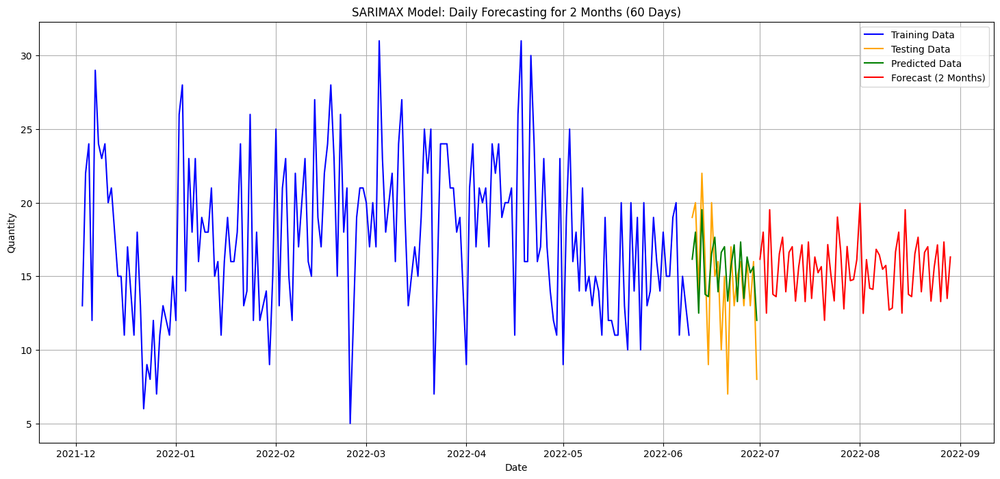

In [128]:
# !pip install statsmodels

import warnings
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Ignore warnings
warnings.filterwarnings('ignore')

# Load dataset
# **Changed file path to the correct file name 'enhanced_data.xlsx'**
file_path = '/content/drive/MyDrive/infosys/enhanced_data.xlsx'
data = pd.read_excel(file_path)

data['Day Index'] = pd.to_datetime(data['Day Index'])  # Ensure datetime format
data.set_index('Day Index', inplace=True)  # Set date as index

# Split into train (90%) and test (10%)
train_size = int(len(data) * 0.9)
train = data.iloc[:train_size]
test = data.iloc[train_size:]

# Define exogenous variables
exog_train = train[['Impressions', 'Clicks', 'Month Name', 'Weekend', 'Day of Week']]
exog_test = test[['Impressions', 'Clicks', 'Month Name', 'Weekend', 'Day of Week']]

# Convert categorical variables using one-hot encoding
all_data = pd.concat([exog_train, exog_test])
all_data = pd.get_dummies(all_data, drop_first=True)

exog_train = all_data.iloc[:len(exog_train)]
exog_test = all_data.iloc[len(exog_train):]

# Ensure numeric dtype
exog_train = exog_train.astype(float)
exog_test = exog_test.astype(float)

# Define and fit SARIMAX model with the best parameters
model = SARIMAX(
    train['imputed_Quantity'],
    exog=exog_train,
    order=(0, 0, 1),
    seasonal_order=(0, 1, 1, 6),
    enforce_stationarity=False,
    enforce_invertibility=False
).fit(disp=False, maxiter=50)

# Forecast for test set
test_forecast_steps = len(test)
predictions = model.forecast(steps=test_forecast_steps, exog=exog_test)

# Forecast additional 2 months (60 days) beyond the test data
future_steps = 60  # 60 days
future_index = pd.date_range(start=test.index[-1] + pd.Timedelta(days=1), periods=future_steps, freq='D')

# You need 60 rows in the future_exog
future_exog = pd.concat([exog_test] * (future_steps // len(exog_test) + 1))
future_exog = future_exog.iloc[:future_steps]

future_forecast = model.forecast(steps=future_steps, exog=future_exog)
# Combine forecast data into a DataFrame for better display
future_forecast_df = pd.DataFrame({
    'Date': future_index,
    'Forecasted_Quantity': future_forecast
})
future_forecast_df.set_index('Date', inplace=True)

# Print the forecasted values
print("Daily Forecasted `imputed_Quantity` for 2 Months (60 Days):")
print(future_forecast_df)

# Calculate metrics
mae = mean_absolute_error(test['imputed_Quantity'], predictions)
rmse = np.sqrt(mean_squared_error(test['imputed_Quantity'], predictions))
mape = np.mean(np.abs((test['imputed_Quantity'] - predictions) / test['imputed_Quantity'])) * 100
r2 = r2_score(test['imputed_Quantity'], predictions)

print(f"\nModel Performance Metrics:\nMAE: {mae:.4f}\nRMSE: {rmse:.4f}\nMAPE: {mape:.2f}%\nR^2: {r2:.4f}")

# Plot results
plt.figure(figsize=(18, 8))

# Plot training data
plt.plot(train['imputed_Quantity'], label='Training Data', color='blue')

# Plot testing data
plt.plot(test['imputed_Quantity'], label='Testing Data', color='orange')

# Plot predicted data
plt.plot(test.index, predictions, label='Predicted Data', color='green')

# Plot future forecast data
plt.plot(future_forecast_df.index, future_forecast_df['Forecasted_Quantity'], label='Forecast (2 Months)', color='red')

plt.title('SARIMAX Model: Daily Forecasting for 2 Months (60 Days)')
plt.xlabel('Date')
plt.ylabel('Quantity')
plt.legend()
plt.grid()
plt.show()

### Conclusion:

This project takes a structured approach to understanding and forecasting sales data using dynamic multivariate regression techniques. By following a seven-week timeline, we systematically explore the process of data collection, preparation, model building, and evaluation.

1. **Data Collection**: We begin by gathering relevant sales data, including Google Analytics and Facebook impressions, which form the foundation for our modeling efforts.
   
2. **Exploratory Data Analysis (EDA)**: The second week focuses on ensuring that the data is in a time series format, followed by cleaning and preprocessing to handle missing values, outliers, and visualize trends.

3. **Time Series Modeling**: In weeks 3 and 4, we explore univariate time series models, followed by evaluating their performance with various error metrics to ensure optimal model fit.

4. **Dynamic Multivariate Regression**: Starting in week 5, we move to dynamic regression, incorporating lagged values of the dependent and independent variables. The analysis is enhanced with interaction terms to better capture the influence of past data on future sales.

5. **Model Construction and Evaluation**: By week 6, we build and progressively refine dynamic regression models, assessing them with performance metrics like R-squared, RMSE, and MAE.

6. **Model Selection and Forecasting**: In the final week, we compare model performance using test data, select the best-performing model, and generate forecasts to guide future decision-making.

The project culminates in a robust, data-driven model for forecasting sales, allowing for strategic decisions based on trends, seasonal factors, and past performance. The overall goal is to leverage historical data and predictive techniques to gain valuable insights into future sales trends.